# Final Project Team 19
Spiros Lambrou s232525 ,
 Antonis Pavlou s233562 ,
 Lydia Kasapi s233564

# Sentiment and Social Graph Analysis of the 2024 U.S. Presidential Election Tweets


## Introduction

In this project, we aim to analyze a subset of tweets related to the 2024 U.S. Presidential Election, focusing on how sentiment and user interactions shape online political discourse. Social media platforms, such as X (formerly Twitter), play a critical role in shaping public opinion and enabling political discussions. By leveraging natural language processing (NLP) and network science techniques, this project seeks to uncover patterns of engagement, sentiment dynamics, and the formation of echo chambers during this significant political event.

---

### Why This Project?

We chose this project because the 2024 U.S. Presidential Election is a highly relevant and timely topic. Analyzing social media interactions offers valuable insights into how public opinion is shaped and how communities form around political discourse. This project allows us to explore sentiment trends, community dynamics, and the impact of major events, making it an interesting and manageable investigation with the potential for meaningful conclusions about online political behavior.

---

## Scope of the Project

Due to the large size of the original dataset (22 million tweets), we focus on a representative subset of **three datasets** that capture key interactions and discourse patterns. These datasets contain a mix of user metadata, tweet content, and interaction data, providing a rich foundation for:
1. **Social Graph Construction**:
   - Identifying communities and examining their interactions.
2. **Sentiment Analysis**:
   - Evaluating public satisfaction within and across communities.
3. **Polarization Analysis**:
   - Investigating whether communities remain isolated or engage across divides.
4. **Event Analysis**:
   - Studying how major election events influence sentiment and community structure.

---

## Dataset Description

The datasets used in this project include detailed information about tweets, users, and their interactions. Below are the key columns and their descriptions:

### **Tweet Metadata**
- **id**: Unique identifier for each tweet.
- **text**: Content of the tweet.
- **epoch**: Timestamp of the tweet in Unix format.
- **lang**: Language of the tweet.
- **hashtags**: List of hashtags in the tweet.
- **replyCount**, **retweetCount**, **likeCount**, **quoteCount**: Engagement metrics.

### **User Metadata**
- **user**: A nested dictionary containing details such as:
  - `id`: User's unique ID.
  - `followersCount`: Number of followers.
  - `statusesCount`: Number of tweets posted by the user.
  - `location`: Location of the user (if available).

### **Interaction Metadata**
- **mentionedUsers**: Users mentioned in the tweet.
- **retweetedTweet**: Indicates whether the tweet is a retweet.
- **conversationId**: ID representing the conversation thread.

## Section 1 : Social Graph Construction:
   - Identifying communities and examining their interactions.

In [26]:
import csv
import json
import gzip

# File paths for the compressed CSV files
csv_file_path1 = 'dataset1.csv.gz'
csv_file_path2 = 'dataset2.csv.gz'
csv_file_path3 = 'dataset3.csv.gz'
json_file_path = 'output.json'

# Function to read a compressed CSV file and return data as a list of dictionaries
def load_csv_gz(file_path):
    with gzip.open(file_path, mode='rt', encoding='utf-8') as csv_file:
        csv_reader = csv.DictReader(csv_file)
        return [row for row in csv_reader]

# Load all datasets
data1 = load_csv_gz(csv_file_path1)
data2 = load_csv_gz(csv_file_path2)
data3 = load_csv_gz(csv_file_path3)

# Combine datasets
merged_data = data1 + data2 + data3

# Optional: Remove duplicates by tweet ID (assuming 'id' or 'id_str' is the unique identifier)
unique_data = {tweet.get('id_str', tweet.get('id', None)): tweet for tweet in merged_data}.values()

# Write merged and deduplicated data to a JSON file
with open(json_file_path, mode='w', encoding='utf-8') as json_file:
    json.dump(list(unique_data), json_file, indent=4)

print("Merging complete! JSON file saved as 'output.json'")


Merging complete! JSON file saved as 'output.json'


In [27]:
import os

file_path = "output.json"
file_size_mb = os.path.getsize(file_path) / (1024 * 1024)  # Convert bytes to MB
print(f"File size: {file_size_mb:.2f} MB")


File size: 331.19 MB


In [28]:
import json

# Load the JSON file
with open('output.json', 'r', encoding='utf-8') as file:
    data = json.load(file)

num_rows = len(data)
print(f"Number of rows: {num_rows}")


Number of rows: 138586


In [29]:
num_variables = len(data[0].keys())
print(f"Number of variables: {num_variables}")


Number of variables: 30


Find the number of unique ids

In [30]:
import json

# Load the JSON data
with open('output.json', 'r', encoding='utf-8') as file:
    data = json.load(file)

# Extract all tweet IDs
tweet_ids = [tweet.get('id_str') for tweet in data if tweet.get('id_str')]

# Get the number of unique tweet IDs
unique_tweet_ids = len(set(tweet_ids))
print("Number of unique tweet IDs:", unique_tweet_ids)

Number of unique tweet IDs: 138586


We have 138586 unique ids. In twitter's structure, each tweet is assigned a unique id, so a single tweet should theoretically have only one unique ID, meaning duplicate tweets should not have different IDs. However here are some scenarios where we might encounter what appears to be duplicate content with different IDs in our dataset:

1. Retweets and Quotes:
 - A retweet or quote tweet shares the same content or a similar message but has a different id_str because it is treated as a new tweet.
 - If your dataset includes both the original tweet and its retweets or quotes, you might see the same or very similar content with different tweet IDs.
2. Copy-Paste Tweets:
 - Sometimes, users copy and paste the same content across multiple tweets. Although the text may look identical, these tweets are technically distinct and have unique IDs.
3. Content Similarity but Different Authors:
 - Some tweets may contain identical or very similar content posted by different users, each with a unique id_str.


### Let's check the contnet similarity
We want to check for tweets with similar content :
 - Group by content: use text conent to identify duplicate or similar tweets, regardless of their IDs.
 - Use a data similarity check: Libraries like fuzzywuzzy or difflib can help compare tweet content to find near duplicates. 

In [31]:
from collections import defaultdict
# the code groups tweets with identical text, so it already identifies exact duplicates. 
# Dictionary to store tweet IDs by their text content
content_dict = defaultdict(list)

# Populate the dictionary
for tweet in data:
    tweet_id = tweet.get('id_str')
    text = tweet.get('text')
    if tweet_id and text:
        content_dict[text].append(tweet_id)

# Find tweets with identical content but different IDs
duplicate_content = {text: ids for text, ids in content_dict.items() if len(ids) > 1}

# Print results
print("Number of tweets with duplicate content:", len(duplicate_content))
for text, ids in duplicate_content.items():
    print(f"Content: {text}")
    print(f"Tweet IDs: {ids}")
    print()


Number of tweets with duplicate content: 591
Content: ❤️
Tweet IDs: ['1801041701688987700', '1801041110107562250', '1801040753264628223', '1801040499530150129', '1801040347532837267', '1801040229026975755', '1801040005873197500']

Content: MAGA🔥
Tweet IDs: ['1801041664884318320', '1801036922695069809', '1801016585101971591', '1801016488372953124', '1801015554121072650', '1801014159662080070', '1801013940308041732', '1801011558006259981', '1801005557274354005']

Content: MAGA
Tweet IDs: ['1801041629672804352', '1801040334438240285', '1801034839086268805', '1801030165310390396', '1801028625682112918', '1801022903904821572', '1801019938292773031', '1801016793416245454', '1801009477778350301', '1801008793561546773', '1801007843706880261']

Content: @MarioNawfal So now our dollar isn’t worth anything. Good going Biden. Way to push all our enemies into an alliance together.
Tweet IDs: ['1801041559837614091', '1801022469441990711']

Content: 🇺🇸Joe Biden, seçim kampanyasında Coinbase Commerce 

To clean the dataset as described, we can perform the following steps:

1. Filter English Tweets: Removed non-English tweets to ensure consistency and reduce noise, keeping only relevant data for analysis.

2. Build Directed Graph: Created a directed graph where each node represents a unique Twitter user.

3. Node Attributes: Added user-specific attributes, including:

    - Tweets they posted.
    - Engagement metrics (likes, retweets, replies, etc.).
    - Metadata like location, language, and mentions.
    Purpose of the Graph: This graph provides a structured representation of Twitter users and their activity, forming the basis for analyzing social interactions, sentiment, and community dynamics.

In [32]:
import json
import networkx as nx
import ast
import re

# Load the JSON data
with open('output.json', 'r', encoding='utf-8') as file:
    data = json.load(file)

# Step 1: Filter for English tweets only
english_tweets = [tweet for tweet in data if tweet.get('lang') == 'en']
non_english_count = len(data) - len(english_tweets)
print(f"Number of non-English tweets removed: {non_english_count}")

# Step 2: Create a directed graph with users as nodes
G = nx.DiGraph()

# Function to clean and extract username from the user field
def clean_and_extract_username(user_str):
    try:
        # Replace datetime and other non-standard objects with strings for safe evaluation
        user_str_clean = re.sub(r"datetime\.[\w]+\([^\)]*\)", "''", user_str)
        
        # Convert cleaned string to a dictionary
        user_dict = ast.literal_eval(user_str_clean)
        
        # Extract the 'username' field
        return user_dict.get('username', None)
    except (ValueError, SyntaxError) as e:
        print(f"Error parsing user string: {user_str}")
        return None

# Add nodes with additional attributes based on username
unique_usernames = set()  # Set to store unique usernames
for tweet in english_tweets:
    # Extract the username
    username = clean_and_extract_username(tweet.get('user', '{}'))
    if username:
        # Add to the set of unique usernames
        unique_usernames.add(username)
        
        # Add or update the user node with aggregated attributes
        if not G.has_node(username):
            G.add_node(username, tweets=[])
        
        # Process viewCount safely
        view_count = tweet.get('viewCount', '{}')
        if isinstance(view_count, str):
            try:
                view_count = ast.literal_eval(view_count)  # Convert string to dictionary if possible
            except (ValueError, SyntaxError):
                view_count = {}  # Fallback if conversion fails
        view_count_value = int(view_count.get('count', 0)) if isinstance(view_count, dict) else int(float(view_count))

        # Add tweet data as an attribute, converting to int as needed
        G.nodes[username]['tweets'].append({
            'tweet_id': tweet.get('id_str', ''),
            'text': tweet.get('text', ''),
            'url': tweet.get('url', ''),
            'replyCount': int(float(tweet.get('replyCount', 0))),  # Convert to float first, then to int
            'retweetCount': int(float(tweet.get('retweetCount', 0))),  # Same for retweetCount
            'likeCount': int(float(tweet.get('likeCount', 0))),
            'quoteCount': int(float(tweet.get('quoteCount', 0))),
            'conversationId': tweet.get('conversationId', ''),
            'mentioned_user_ids': tweet.get('mentionedUsers', []),
            'in_reply_to_status_id': tweet.get('in_reply_to_status_id', None),
            'in_reply_to_user_id': tweet.get('in_reply_to_user_id', None),
            'viewCount': view_count_value,
            'date': tweet.get('date', ''),
            'lang': tweet.get('lang', ''),
            'location': tweet.get('location', '')
        })

# Print unique usernames count
print("Total number of unique usernames in the dataset:", len(unique_usernames))

# Print graph summary and a sample of nodes
print("Total number of nodes (usernames) in the graph:", G.number_of_nodes())
print("\nSample nodes in the graph (with attributes):")

# Display a sample of nodes to check the attributes
for i, (node_id, node_data) in enumerate(G.nodes(data=True)):
    if i < 5:  # Adjust to show more or fewer sample nodes
        print(f"Username: {node_id}")
        print("Attributes:", node_data)
        print("-----")
    else:
        break


Number of non-English tweets removed: 18667
Total number of unique usernames in the dataset: 79985
Total number of nodes (usernames) in the graph: 79985

Sample nodes in the graph (with attributes):
Username: B. G. Dalena
Attributes: {'tweets': [{'tweet_id': '1801041792923578484', 'text': '@lukepbeasley I cant imagine anyone actually feels this way. As much as you hate Donald trump, you don’t believe this. Brainwashed, complicit (black mail or money), or just have no clue whats going in and just want to fit in somewhere. There are no other options', 'url': 'https://twitter.com/orgneyezedchaos/status/1801041792923578484', 'replyCount': 0, 'retweetCount': 0, 'likeCount': 1, 'quoteCount': 0, 'conversationId': '1.8006810262489418e+18', 'mentioned_user_ids': "[{'id_str': '1483596463221264387', 'name': 'Luke Beasley', 'screen_name': 'lukepbeasley', 'indices': [0, 13]}]", 'in_reply_to_status_id': None, 'in_reply_to_user_id': None, 'viewCount': 10, 'date': '', 'lang': 'en', 'location': ''}]}
-



Out of the original dataset, 18667 non-English tweets were removed, leaving only English tweets for analysis. A total of 79985 unique usernames were identified in the dataset, forming the nodes of the directed graph. Each node represents a user, and attributes such as the user's tweets, engagement metrics (likes, retweets, replies and view counts), and interactions were added. 

## Explanation of the next cell
1. Adding Mentions to the Graph:

    - For each tweet, we extract the mentioned users (mentioned_user_ids).
    - If the mentioned user is not already a node in the graph, they are added as a new node with minimal attributes.


2. Tracking Nodes:
    - Counts are kept for:
        - Existing Nodes: Mentioned users who were already present as nodes.
        - New Nodes: Mentioned users added as new nodes.

3. Purpose:

    - Expands the graph by including interaction relationships, allowing the graph to better represent social connections between users based on mentions.

In [33]:
# Initialize counters for existing and new nodes
existing_nodes_count = 0
new_nodes_count = 0

# Set to track unique mentioned users
unique_mentioned_users = set()

for tweet in english_tweets:
    username = clean_and_extract_username(tweet.get('user', '{}'))
    if username:
        # Ensure the user is in the graph
        if not G.has_node(username):
            G.add_node(username, tweets=[])
        
        # Process each mentioned user in 'mentioned_user_ids'
        mentioned_users = ast.literal_eval(tweet.get('mentionedUsers', '[]'))
        for mentioned_user in mentioned_users:
            mentioned_screen_name = mentioned_user.get('screen_name')
            
            if mentioned_screen_name:
                # Track unique mentioned users
                unique_mentioned_users.add(mentioned_screen_name)
                
                # Check if the mentioned user is already a node
                if G.has_node(mentioned_screen_name):
                    existing_nodes_count += 1
                else:
                    print(f"'{mentioned_screen_name}' does not exist as a node and will be added.")
                    # Add the mentioned user with empty attributes
                    G.add_node(mentioned_screen_name, tweets=[], mentioned_only=True)
                    new_nodes_count += 1
                

# Print the summary
print(f"Total number of mentioned users that already existed as nodes: {existing_nodes_count}")
print(f"Total number of new nodes added for mentioned users: {new_nodes_count}")
print(f"Total number of unique mentioned users: {len(unique_mentioned_users)}")




'lukepbeasley' does not exist as a node and will be added.
'Potomacbeat' does not exist as a node and will be added.
'BobOnderMO' does not exist as a node and will be added.
'Morning_Joe' does not exist as a node and will be added.
'JoeNBC' does not exist as a node and will be added.
'YouTube' does not exist as a node and will be added.
'ShaunPMaca' does not exist as a node and will be added.
'MoneyTalkUS' does not exist as a node and will be added.
'byHeatherLong' does not exist as a node and will be added.
'RepAdamSchiff' does not exist as a node and will be added.
'TheOnlyEsta' does not exist as a node and will be added.
'DonMartinCTV' does not exist as a node and will be added.
'LadyMagaUSA' does not exist as a node and will be added.
'nypost' does not exist as a node and will be added.
'teenburger' does not exist as a node and will be added.
'nedryun' does not exist as a node and will be added.
'WesternLensman' does not exist as a node and will be added.
'MZHemingway' does not exi

This process allowed us to identify 88,580 mentioned users already present as nodes, add 24,952 new nodes for previously unseen mentioned users, and find a total of 26,944 unique mentioned users in the dataset. No edges were added at this stage.

In [34]:
print("Total number of nodes in the graph:", G.number_of_nodes())


Total number of nodes in the graph: 104937


### Adding Edges to the Graph: Replies and Mentions
In this step, we enhanced the social graph by adding directed edges to represent interactions between Twitter users:

1. Reply Edges:

    - If a tweet is a reply (in_reply_to_screen_name is not empty), a directed edge is added from the author to the user they replied to.
    - If the replied-to user is not already in the graph, they are added as a new node.
    
    **Total Reply Edges Added: 93,318**

2. Mention Edges:

    - If a tweet contains mentions (mentionedUsers), directed edges are added from the author to each mentioned user.
    - New nodes are created for mentioned users if they don’t already exist.

    **Total Mention Edges Added: 5,750**

In [35]:
# Initialize counters to track edges added
reply_edges_count = 0
mention_edges_count = 0

for tweet in english_tweets:
    # Extract the tweet author's username
    author_username = clean_and_extract_username(tweet.get('user', '{}'))
    
    if author_username:
        # Ensure the author is a node in the graph
        if not G.has_node(author_username):
            G.add_node(author_username, tweets=[])
        
        # Step 1: Add a reply edge if `in_reply_to_screen_name` exists
        replied_to_user = tweet.get('in_reply_to_screen_name')
        if replied_to_user:
            # Ensure the replied-to user is a node
            if not G.has_node(replied_to_user):
                G.add_node(replied_to_user, tweets=[], mentioned_only=True)  # Default attributes for mentioned users
            
            # Create a directed edge from the author to the replied-to user
            G.add_edge(author_username, replied_to_user, interaction='reply')
            reply_edges_count += 1
        
        # Step 2: If not a reply, process mentions from `mentionedUsers`
        elif tweet.get('mentionedUsers', '[]'):
            mentioned_users = ast.literal_eval(tweet.get('mentionedUsers', '[]'))
            for mentioned_user in mentioned_users:
                mentioned_username = mentioned_user.get('screen_name')
                
                if mentioned_username:
                    # Ensure the mentioned user is a node
                    if not G.has_node(mentioned_username):
                        G.add_node(mentioned_username, tweets=[], mentioned_only=True)
                    
                    # Create a directed edge from the author to the mentioned user
                    G.add_edge(author_username, mentioned_username, interaction='mention')
                    mention_edges_count += 1

# Print the summary of edges added
print(f"Total number of reply edges added: {reply_edges_count}")
print(f"Total number of mention edges added: {mention_edges_count}")


Total number of reply edges added: 93318
Total number of mention edges added: 5750


**Interpreting the Results**

1. Reply Edges (93,318):

The high number of reply edges indicates strong conversational engagement, with users actively participating in discussions and forming tightly connected clusters or communities.

2. Mention Edges (5,750):

The lower count of mentions suggests that users rarely tag others unless replying directly, focusing more on direct conversations rather than broadcasting or referencing others.

In [36]:
total_edges = G.number_of_edges()
print(f"Total number of edges in the graph: {total_edges}")


Total number of edges in the graph: 93701


We observed that the total number of edges in the graph is less than the sum of the two edge types. The reason is because if an edge representing a reply is added and later another edge representing a mention between the same pair of users is attempted , networkx will not create a duplicate edge in a directed graph. Instead it will overwrite the existing edge with the latest attributes. 

In [37]:
import json
import networkx as nx
import ast
import re

In [38]:
# this method preserved all attributes and is efficient for later use 
# save the graph
import pickle

with open('graph.pkl', 'wb') as file:
    pickle.dump(G, file)


In [39]:
with open('graph.pkl', 'rb') as file: # loading the graph 
    G = pickle.load(file)


The ***largest component*** in a network refers to the biggest connected subgraph, where all nodes are reachable from one another, either directly or indirectly.

In [40]:
import networkx as nx

# Ensure `G` is defined as your directed graph from previous steps
# Extract the largest weakly connected component
weakly_connected_components = nx.weakly_connected_components(G)
largest_component = max(weakly_connected_components, key=len)

# Create a subgraph with only the largest component
G_largest = G.subgraph(largest_component).copy()

# Print the number of nodes and edges in the largest component
num_nodes = G_largest.number_of_nodes()
num_edges = G_largest.number_of_edges()

print(f"Number of nodes in the largest component: {num_nodes}")
print(f"Number of edges in the largest component: {num_edges}")


Number of nodes in the largest component: 64605
Number of edges in the largest component: 80573


- Number of Nodes (64,605):

This represents the number of unique users in the largest connected part of the network. These users are either directly or indirectly connected through replies or mentions, forming the most interactive group in the dataset.

- Number of Edges (80,573):

This indicates the total interactions (replies and mentions) within the largest component. The high edge count relative to nodes suggests active engagement among these users.

## Analyze the largest component 
Compute key metrics such as density

In [41]:
print(f"Density of the largest component: {nx.density(G_largest)}")


Density of the largest component: 1.9304741691448628e-05


This value indicates a highly sparse network where only a tiny fraction of all possible connectios between users are realized. This low density is typical for large scale social networks, where interactions are primarily localized within smaller groups rather than evenly distributed across the entire network. Such sparsity reflects the nature of social interactions , where users tend to engage with a limited subset of individuals (e.g., replying to or mentioning specific accounts). 

To visualize the structure of the largest connected component in the social graph, we randomly sampled 2,500 nodes to create a subgraph. Given the size of the original component (64,605 nodes and 80,573 edges), sampling was necessary to ensure clarity and reduce computational overhead. A spring layout was used to position the nodes, optimizing for interpretability by spreading densely connected areas apart while preserving the relative structure. Nodes are represented as small dots, and edges as gray lines, emphasizing the sparsity and clustering of interactions. This visualization provides a representative snapshot of the network's structure, highlighting local clusters and potential hubs while retaining an overview of its overall connectivity.

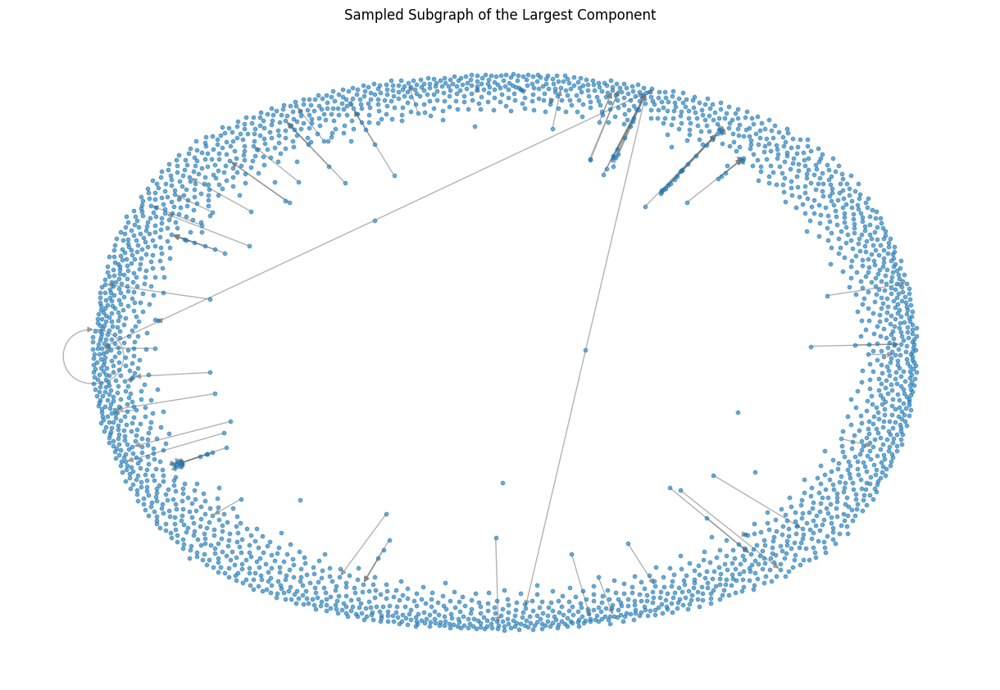

In [43]:
import random
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib

# Step 1: Ensure a Unicode-supporting font is used
# Replace 'Noto Sans Symbols' with the installed font name on your system
matplotlib.rcParams['font.family'] = 'DejaVu Sans'  # Commonly available on most systems
# If you installed "Noto Sans Symbols" or similar, use that instead.

# Step 2: Random sampling of nodes for visualization
# Adjust the number of sampled nodes for clarity (e.g., 1000 nodes)
sampled_nodes = random.sample(list(G_largest.nodes()), 2500)
G_sample = G_largest.subgraph(sampled_nodes)

# Step 3: Generate a layout for better visualization
# Use a spring layout for a more meaningful representation
pos = nx.spring_layout(G_sample, seed=42)  # seed ensures reproducibility

# Step 4: Draw the graph
plt.figure(figsize=(12, 8))
nx.draw(
    G_sample, 
    pos, 
    node_size=10, 
    alpha=0.6, 
    with_labels=False,  # Turn labels off to reduce clutter
    edge_color="gray"   # Set edge color for better readability
)
plt.title("Sampled Subgraph of the Largest Component")
plt.show()


The plot shows a sparse network with clusters of nodes connected by long edges, indicating localized interactions. The circular shape highlights a few key hubs and bridges between clusters, reflecting the scattered and decentralized nature of the network.

### Next plot
The next plot is just a sampled subgraph of our largest connected component, where each node represents a twitter user, the sie of each node is proportional to its degree, larger nodes indicate users with more interactions, such as replies or mentions. We observed such as several small clusters of tightly connected nodes, representing groups of users that interacti more frequently within their group that with others. 

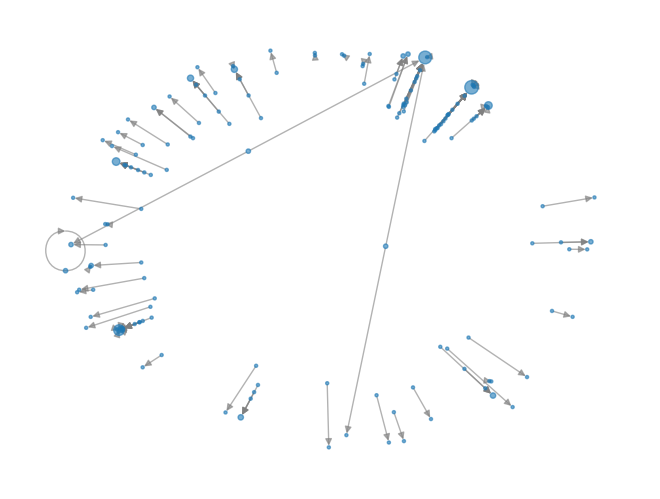

In [44]:
node_sizes = [G_sample.degree(n) * 5 for n in G_sample.nodes()]
nx.draw(G_sample, pos, node_size=node_sizes, alpha=0.6, with_labels=False, edge_color="gray")


The plot highlights a sampled subgraph where node size represents interaction frequency. Larger nodes indicate high-activity users (e.g., frequent mentions or replies), while smaller clusters show localized interactions within specific groups. The structure reveals hubs and dense connections in certain areas, characteristic of social interaction dynamics.

#### Plot the largest component of Network using the forceAtlas

Loaded saved positions from file.


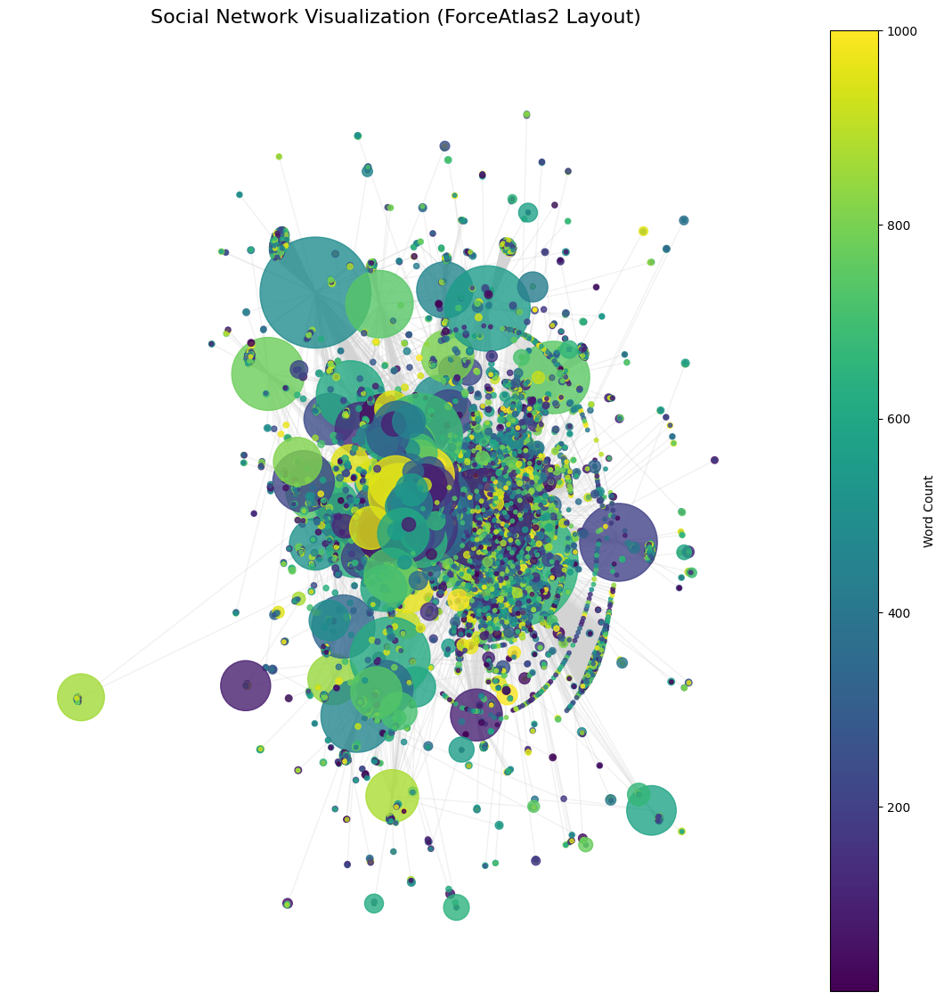

In [46]:
import networkx as nx
import matplotlib.pyplot as plt
import json
from fa2_modified import ForceAtlas2


# Convert to undirected graph
G_largest_undirected = G_largest.to_undirected()

# Ensure you have the largest connected component of the undirected graph
largest_cc = max(nx.connected_components(G_largest_undirected), key=len)
G_largest = G_largest_undirected.subgraph(largest_cc).copy()


positions_file = "forceatlas2_positions.json"

# Check if positions are already saved
try:
    with open(positions_file, 'r') as file:
        positions = json.load(file)
    print("Loaded saved positions from file.")
except FileNotFoundError:
    # Calculate ForceAtlas2 positions if not saved
    forceatlas2 = ForceAtlas2(
        outboundAttractionDistribution=True,  # Dissuade hubs
        linLogMode=False,
        adjustSizes=False,
        edgeWeightInfluence=1.0,
        jitterTolerance=1.0,  # Tolerance for convergence
        barnesHutOptimize=True,
        barnesHutTheta=1.2,
        scalingRatio=2.0,
        strongGravityMode=False,
        gravity=1.0,
        verbose=True
    )

    positions = forceatlas2.forceatlas2_networkx_layout(G_largest, pos=None, iterations=2000)
    
    # Save positions to a file for later use
    with open(positions_file, 'w') as file:
        json.dump(positions, file)
    print("Calculated and saved positions to file.")

# Assign 'word_count' to nodes if not already present (example values, replace with actual logic)
import random
for node in G_largest.nodes():
    if 'word_count' not in G_largest.nodes[node]:
        G_largest.nodes[node]['word_count'] = random.randint(10, 1000)  # Replace with actual word count logic

# Node size based on degree
node_size = [G_largest.degree(n) * 10 for n in G_largest.nodes()]  # Adjust multiplier for visibility

# Node color based on 'word_count'
node_colors = [
    G_largest.nodes[n].get('word_count', 0) for n in G_largest.nodes()
]
vmin = min(node_colors)
vmax = max(node_colors)

if vmin == vmax:  # Prevent normalization issues
    vmin, vmax = 0, vmax + 1

cmap = plt.cm.viridis

# Plot the graph
fig, ax = plt.subplots(figsize=(14, 14))
nx.draw_networkx_nodes(
    G_largest,
    positions,
    node_size=node_size,
    node_color=node_colors,
    cmap=cmap,
    alpha=0.8,
    vmin=vmin,
    vmax=vmax,
    ax=ax
)
nx.draw_networkx_edges(G_largest, positions, edge_color="lightgray", alpha=0.3, ax=ax)
plt.title("Social Network Visualization (ForceAtlas2 Layout)", fontsize=16)

# Add colorbar for 'word_count'
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
fig.colorbar(sm, ax=ax, label="Word Count")

plt.axis('off')
plt.show()


In this plot, all nodes of the largest connected component were used, not a sampled subset. The visualization is comprehensive, representing the entire largest connected component. This plot highlights the community structure within the largest connected component, with dense clusters representing groups of users interacting frequently. Larger nodes indicate influential users (hubs) with many connections, while the color gradient reflects the word_count, identifying content-rich users. The network's sparsity and localized clusters are typical of social networks, emphasizing fragmented yet interconnected interactions.

### Degree Distribution
The degree distribution shows how many nodes have a specific degree (number of connetions). Here we are using all the nodes in the directed graph. 


Plot in-degree and out-degree distributions.

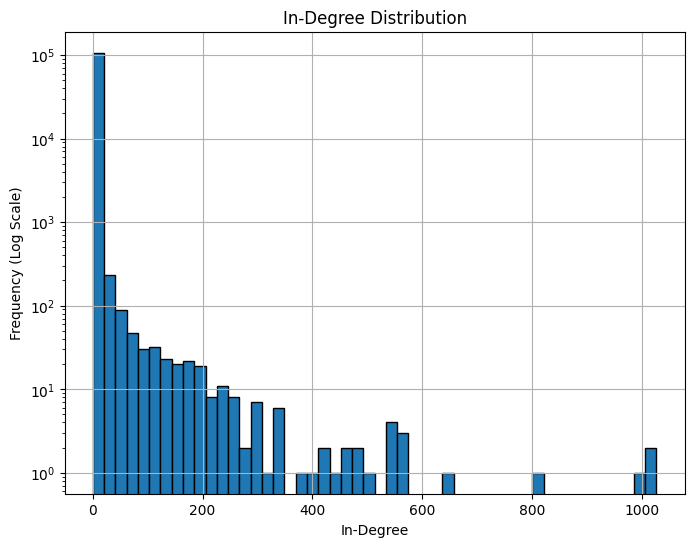

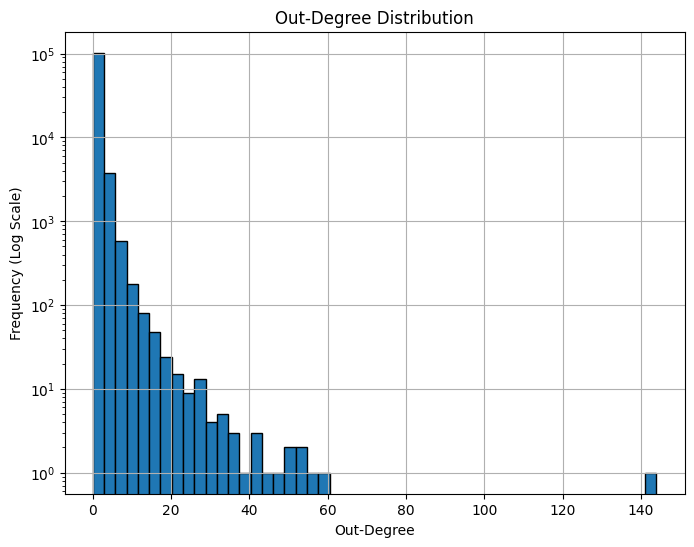

In [47]:
import matplotlib.pyplot as plt

# Calculate in-degree and out-degree for each node
in_degrees = [deg for _, deg in G.in_degree()]
out_degrees = [deg for _, deg in G.out_degree()]

# Plot the in-degree distribution
plt.figure(figsize=(8, 6))
plt.hist(in_degrees, bins=50, edgecolor='black', log=True)
plt.title('In-Degree Distribution')
plt.xlabel('In-Degree')
plt.ylabel('Frequency (Log Scale)')
plt.grid(True)
plt.show()

# Plot the out-degree distribution
plt.figure(figsize=(8, 6))
plt.hist(out_degrees, bins=50, edgecolor='black', log=True)
plt.title('Out-Degree Distribution')
plt.xlabel('Out-Degree')
plt.ylabel('Frequency (Log Scale)')
plt.grid(True)
plt.show()


Degree Distributions:

The in-degree distribution (first plot) shows how frequently users are mentioned or replied to by others. A small subset of users has significantly high in-degrees, suggesting the presence of influential or central users in the network.


The out-degree distribution (second plot) highlights the frequency of users engaging with others. Most users have low out-degrees, indicating limited interactions from individual users.

### Analyze in-degree and out-degree statistics

Calculate descriptive statistics (mean, median, mode, min, and max).
Interpreting  the results by considering what they reveal about the network's structure (e.g., hubs, symmetry, sparsity).

In [48]:
import numpy as np
from statistics import mode

# Get in-degrees and out-degrees
in_degrees = [G.in_degree(n) for n in G.nodes()]
out_degrees = [G.out_degree(n) for n in G.nodes()]

# Descriptive statistics
in_stats = {
    "average": np.mean(in_degrees),
    "median": np.median(in_degrees),
    "mode": mode(in_degrees),
    "min": np.min(in_degrees),
    "max": np.max(in_degrees),
}

out_stats = {
    "average": np.mean(out_degrees),
    "median": np.median(out_degrees),
    "mode": mode(out_degrees),
    "min": np.min(out_degrees),
    "max": np.max(out_degrees),
}

print("In-degree statistics:", in_stats)
print("Out-degree statistics:", out_stats)


In-degree statistics: {'average': 0.8758985576338839, 'median': 0.0, 'mode': 0, 'min': 0, 'max': 1027}
Out-degree statistics: {'average': 0.8758985576338839, 'median': 1.0, 'mode': 1, 'min': 0, 'max': 144}


The in-degree statistics show that the average node receives approximately 0.88 incoming links, with a median of 0, indicating that at least half the nodes in the network have no incoming links. The mode of 0 further supports this, suggesting a large proportion of nodes are not referenced by others. However, the maximum in-degree of 1027 highlights the presence of hubs or highly referenced nodes in the network.

The out-degree statistics reveal the same average value (0.88), indicating a balanced number of outgoing and incoming links overall. However, the median out-degree is 1, and the mode is also higher at 1, suggesting that most nodes make at least one connection to another node. The maximum out-degree of 144 is significantly smaller than the maximum in-degree, implying that while some nodes broadcast many links, they are fewer compared to the number of highly referenced nodes.

### Degree distribution exponent:

1. Fit the degree distribution using the powerlaw package.
2. Compute the exponents for in-degree, out-degree, and total degree.
3. Interpret the exponents and compare them with expectations ( scale-free networks typically have exponents between 2 and 3).


###  Degree distribution exponent

In [49]:
import powerlaw

# Fit the distributions
in_degree_fit = powerlaw.Fit(in_degrees)
out_degree_fit = powerlaw.Fit(out_degrees)
total_degrees = [in_d + out_d for in_d, out_d in zip(in_degrees, out_degrees)]
total_degree_fit = powerlaw.Fit(total_degrees)

# Get exponents
print("In-degree exponent:", in_degree_fit.alpha)
print("Out-degree exponent:", out_degree_fit.alpha)
print("Total degree exponent:", total_degree_fit.alpha)


Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
In-degree exponent: 1.843238557631894
Out-degree exponent: 4.037640750833103
Total degree exponent: 2.064766901106222


Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


- In-degree exponent (1.84): Suggests the network is not perfectly scale-free, as the value is below the typical range (2-3). This implies that highly referenced nodes exist but with less extreme disparity.
- Out-degree exponent (4.04): Indicates a steep drop-off in out-degree distribution, meaning most nodes have very few outgoing links, and few nodes broadcast widely.
- Total degree exponent (2.06): Falls within the expected scale-free range, suggesting the overall network exhibits scale-free properties, with a mix of hubs and sparsely connected nodes.

### Explore the attributes of nodes in a graph 

This code retrieves and displays the attributes of a specific node in the graph, then summarizes all unique attributes across all nodes to understand the metadata available in the graph. This helps analyze the types of information stored for each node.

In [50]:
# Get all attributes of the first node (change to any node ID as needed)
example_node = next(iter(G.nodes(data=True)))
print(f"Node ID: {example_node[0]}")
print(f"Attributes: {example_node[1]}")

# To get a summary of all unique node attributes
all_attributes = set()
for node, attributes in G.nodes(data=True):
    all_attributes.update(attributes.keys())

print(f"Unique node attributes: {all_attributes}")


Node ID: B. G. Dalena
Attributes: {'tweets': [{'tweet_id': '1801041792923578484', 'text': '@lukepbeasley I cant imagine anyone actually feels this way. As much as you hate Donald trump, you don’t believe this. Brainwashed, complicit (black mail or money), or just have no clue whats going in and just want to fit in somewhere. There are no other options', 'url': 'https://twitter.com/orgneyezedchaos/status/1801041792923578484', 'replyCount': 0, 'retweetCount': 0, 'likeCount': 1, 'quoteCount': 0, 'conversationId': '1.8006810262489418e+18', 'mentioned_user_ids': "[{'id_str': '1483596463221264387', 'name': 'Luke Beasley', 'screen_name': 'lukepbeasley', 'indices': [0, 13]}]", 'in_reply_to_status_id': None, 'in_reply_to_user_id': None, 'viewCount': 10, 'date': '', 'lang': 'en', 'location': ''}]}
Unique node attributes: {'tweets', 'mentioned_only'}


### Next cell
Identify ***top 5 most connected users*** for in-degrees and out-degrees.

Identify ***10 tweets with the longest content*** by length_of_content attribute.

In [51]:
import pandas as pd

# Top 5 users by in-degree
top_in_degree = sorted(G.in_degree, key=lambda x: x[1], reverse=True)[:5]
print("Top 5 users by in-degree:")
for user, degree in top_in_degree:
    print(f"User: {user}, In-Degree: {degree}")

# Top 5 users by out-degree
top_out_degree = sorted(G.out_degree, key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 users by out-degree:")
for user, degree in top_out_degree:
    print(f"User: {user}, Out-Degree: {degree}")

# Collect tweets data from the graph
tweets_data = []
for node, attrs in G.nodes(data=True):
    tweets = attrs.get('tweets', [])
    for tweet in tweets:
        content = tweet.get('text', '')
        tweets_data.append({'node': node, 'tweet_id': tweet.get('tweet_id', ''), 'length_of_content': len(content), 'content': content})

# Convert to DataFrame
tweets_df = pd.DataFrame(tweets_data)

# Top 10 tweets with the longest content
top_10_longest_tweets = tweets_df.sort_values(by='length_of_content', ascending=False).head(10)
print("\nTop 10 tweets with the longest content:")
print(top_10_longest_tweets[['node', 'tweet_id', 'length_of_content', 'content']])


Top 5 users by in-degree:
User: GOP, In-Degree: 1027
User: JoeBiden, In-Degree: 1013
User: harryjsisson, In-Degree: 1003
User: RNC Research, In-Degree: 803
User: harris_wins, In-Degree: 644

Top 5 users by out-degree:
User: MAGA Memecoin, Out-Degree: 144
User: fulminarey, Out-Degree: 60
User: John, Out-Degree: 55
User: Chris, Out-Degree: 54
User: Mike, Out-Degree: 52

Top 10 tweets with the longest content:
                  node             tweet_id  length_of_content  \
75089        OneToad4u  1792292082645610928               3265   
78111   FedericoMusic3  1792607382889009247               3241   
68409  bill_outerbirch  1795127101487480887               2260   
65536     vealhorrocks  1789784753257738644               1943   
69524   ccarneyrichman  1792294729729589573               1836   
71708       TonySeruga  1781173013393928207               1743   
56424   YadavRamsachin  1792394082217755067               1663   
82729         CureBore  1786056832286335055               163

1. Top 5 Users by In-Degree:

    The most connected users in terms of in-degree are high-profile accounts like GOP, JoeBiden, and RNC Research. These accounts are likely hubs, receiving significant attention and mentions from other users. This indicates their prominent role in the network, possibly as influencers or key opinion leaders.

2. Top 5 Users by Out-Degree:

    The users with the highest out-degree, such as MAGA Memecoin and fulminarey, actively engage with many other users. This suggests they either broadcast content widely or participate in conversations across the network, acting as broadcasters or amplifiers.

3. Top 10 Tweets with the Longest Content:

    - Tweets with the longest content, like those from OneToad4u and FedericoMusic3, often provide detailed opinions, narratives, or context. These tweets might represent attempts to engage deeply with the audience or to convey comprehensive viewpoints.
    - The length of these tweets indicates that some users prefer more detailed and nuanced communication, which could stand out in a platform dominated by shorter interactions.
    - Users with longer tweets might be leveraging the extended format for storytelling, advocacy, or providing detailed commentary on current events.

This code is designed to identify the top 10 users with the most tweets in the graph and display their tweet counts along with sample tweets.

In [52]:
# Calculate the number of tweets for each user
user_tweet_counts = [(node, len(data['tweets'])) for node, data in G.nodes(data=True) if 'tweets' in data]

# Sort users by the number of tweets in descending order and take the top 10
top_10_users_by_tweet_count = sorted(user_tweet_counts, key=lambda x: x[1], reverse=True)[:10]

# Display the results with context
print("Top 10 Users with the Most Tweets:")
for rank, (user, tweet_count) in enumerate(top_10_users_by_tweet_count, 1):
    print(f"{rank}. User: {user}")
    print(f"   Total Tweets: {tweet_count}")
    print(f"   Sample Tweet(s): {G.nodes[user]['tweets'][:2]}")  # Display up to 2 sample tweets for context
    print("-----")


Top 10 Users with the Most Tweets:
1. User: ZBreakingNewz
   Total Tweets: 108
   Sample Tweet(s): [{'tweet_id': '1801039347539652766', 'text': "U.S. House votes to hold attorney general in contempt over Biden audio: Republicans are seeking audio of Joe Biden's interview with prosecutors in his classified documents case, which the Department of Justice has withheld. https://t.co/cilhAjLdM8 https://t.co/Tq6RgK6LUK", 'url': 'https://twitter.com/ZBreakingNewz/status/1801039347539652766', 'replyCount': 0, 'retweetCount': 3, 'likeCount': 3, 'quoteCount': 0, 'conversationId': '1.8010393475396529e+18', 'mentioned_user_ids': '[]', 'in_reply_to_status_id': None, 'in_reply_to_user_id': None, 'viewCount': 53, 'date': '', 'lang': 'en', 'location': ''}, {'tweet_id': '1801039338362528050', 'text': 'Trump And Biden Supporters Diverge Vastly On Questions About Marriage And Family, New Poll Shows: The poll asked\xa0questions\xa0such as whether "society is better off if people make marriage and having c

This output identifies the top 10 users with the most tweets in the graph. By analyzing their tweet counts and sample content, we can gain insights into highly active contributors or potential bots in the network. This helps us understand the distribution of activity and the behavior of prolific users.

### Graph Analysis and Metrics Calculation:

Degree Centrality: Compute centrality measures to understand the most influential nodes (users) in your graph.

In [53]:
centrality = nx.degree_centrality(G)
top_users = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:10]  # Top 10 users
print("Top 10 users by degree centrality:", top_users)


Top 10 users by degree centrality: [('GOP', 0.00960028417588992), ('JoeBiden', 0.009469413700269219), ('harryjsisson', 0.009375934789111577), ('RNC Research', 0.00750635656595872), ('harris_wins', 0.006020041878552198), ('Biden’s Wins', 0.005318950044869877), ('Republicans against Trump', 0.0053002542626383485), ('KamalaHQ', 0.005244166915943763), ('YouTube', 0.005169383787017649), ('BillKristol', 0.005169383787017649)]


Degree centrality measures the relative importance of a node in the network based on the number of direct connections (both incoming and outgoing in a directed graph). Higher degree centrality indicates greater influence within the network.

- Influential Figures:
GOP and JoeBiden have the highest degree centrality, indicating they are at the center of many interactions, likely due to their prominence in political discussions.
harryjsisson appears as a key influencer, possibly due to high engagement or frequent replies/mentions.

- Organizational Influence:Accounts like RNC Research and KamalaHQ highlight the involvement of political organizations driving conversations.

- Media Representation: The inclusion of YouTube and BillKristol shows the role of media and prominent personalities in amplifying discourse.

- Polarized Network: The presence of accounts like Republicans against Trump and Biden’s Wins suggests that users align with specific political affiliations, reflecting polarization in the network.


In [54]:
G_undirected = G_largest.to_undirected() # Using an undirected graph for community detection simplifies the analysis and focuses on relationships rather than the direction of interactions.


Degree centrality for the Undirected graph

In [56]:
degree_centrality = nx.degree_centrality(G_undirected)
top_5_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
print("Top 5 nodes by Degree Centrality:", top_5_degree)


Top 5 nodes by Degree Centrality: [('GOP', 0.015896848492353413), ('JoeBiden', 0.015680143644356385), ('harryjsisson', 0.015525354467215651), ('RNC Research', 0.012429570924400966), ('harris_wins', 0.00996842300786329)]


The output identifies the top 5 nodes by degree centrality in the undirected graph. GOP, JoeBiden, and harryjsisson remain central figures due to their prominence in discussions. The presence of RNC Research and harris_wins further indicates the significant role of political and organizational accounts in fostering connectivity and engagement within the network. This highlights the key nodes that bridge or anchor various communities in the graph.

### Comparison of the Results of the degree centrality : Directed Vs Undirected graph
The comparison between the directed and undirected graphs shows consistency in identifying key influential users like GOP, JoeBiden, and harryjsisson. However, the undirected graph gives higher degree centrality values, reflecting broader mutual connections, while the directed graph highlights influence through specific actions like mentions or replies. Differences in top-ranking nodes, such as KamalaHQ in the directed graph versus RNC Research in the undirected graph, reveal how directionality affects the interpretation of influence and connectedness.

In [ ]:
degree_values = [degree_centrality[n] for n in G_undirected.nodes()]


 ### Next cell
 We calculate the eigenvector centrality for each node in the undirected graph. Eigenvector centrality measures the influence of a node based on the importance of its neighbors, meaning a node is considered important if it is connected to other important nodes. This centrality measure helps identify nodes that play a central role in the network, even if they have fewer direct connections. The top 5 nodes with the highest eigenvector centrality are then identified and displayed.

In [58]:
eigenvector_centrality = nx.eigenvector_centrality_numpy(G_undirected)
top_5_eigenvector = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
print("Top 5 nodes by Eigenvector Centrality:", top_5_eigenvector)


Top 5 nodes by Eigenvector Centrality: [('JoeBiden', 0.4510554695000859), ('harryjsisson', 0.42173087747529897), ('GOP', 0.21975106199280187), ('harris_wins', 0.12785050211500476), ('POTUS', 0.08913076557040193)]


The top 5 nodes by eigenvector centrality show that JoeBiden and harryjsisson are the most influential nodes in the network, with significantly higher centrality scores. This suggests that these users are not only well-connected but are also central within influential communities. GOP ranks third, indicating it holds influence in the network, though to a lesser extent than the top two. harris_wins and POTUS have relatively lower centrality, reflecting their more peripheral roles in comparison to the top influencers.

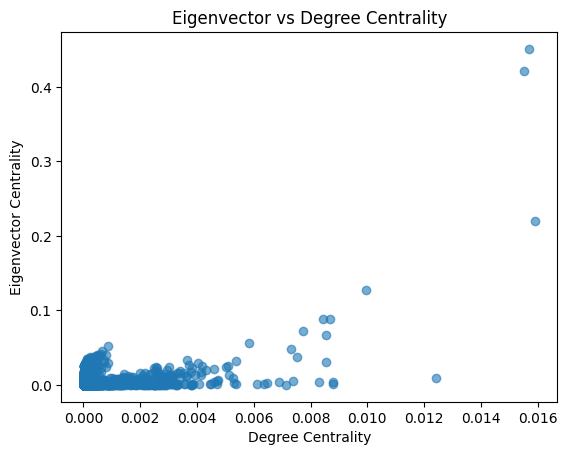

In [59]:
eigenvector_values = [eigenvector_centrality[n] for n in G_undirected.nodes()]

plt.scatter(degree_values, eigenvector_values, alpha=0.6)
plt.xlabel("Degree Centrality")
plt.ylabel("Eigenvector Centrality")
plt.title("Eigenvector vs Degree Centrality")
plt.show()


In the scatter plot, the x-axis represents the degree centrality, which indicates the number of direct connections each node has, while the y-axis represents eigenvector centrality, which measures the influence of a node in the network based on its connections to other influential nodes. Most nodes are clustered at the lower end of both axes, indicating they have few connections and low influence. A few nodes with high degree centrality (towards the right on the x-axis) also exhibit higher eigenvector centrality (upward on the y-axis), suggesting that these nodes not only have many connections but are also connected to other well-connected nodes, making them influential. However, the plot does not show a strong linear relationship, indicating that degree centrality and eigenvector centrality are measuring different types of node importance in the network.

## Section 2 :Sentiment Analysis:
   - Evaluating public satisfaction within and across communities.
### 2.1 : Community detection using Louvain
We used the Louvain community detection algorithm to identify communities in the social network graph ( in the largest connected component of the graph ) . The Louvain method detects modularity, which measures the strength of division of a network into communities. High modularity indicates a stronger division, where nodes (users) within a community are more connected to each other than to nodes in other communities.
The graph used for community detection was undirected, meaning we considered interactions between users irrespective of the direction (mentioning or replying).
Once the communities were detected, each community was associated with a unique identifier, and users (nodes) were grouped accordingly.

In [60]:
import community.community_louvain as community_louvain

# Detect communities
partition = community_louvain.best_partition(G_undirected, resolution=0.9)
print(f"Detected {len(set(partition.values()))} communities.")


Detected 112 communities.


#### Filter Communities

In [61]:
from collections import Counter

# Count the size of each community
community_sizes = Counter(partition.values())
print("Community size distribution:")
for community_id, size in community_sizes.most_common(10):  # Print top 10 largest communities
    print(f"Community {community_id}: {size} nodes")

# Optional: Filter out very small communities if desired
min_size = 5  # Example threshold for minimum community size
filtered_communities = {k: v for k, v in community_sizes.items() if v >= min_size}
print(f"Communities with at least {min_size} nodes: {len(filtered_communities)}")


Community size distribution:
Community 2: 3795 nodes
Community 0: 2491 nodes
Community 39: 2466 nodes
Community 1: 2093 nodes
Community 36: 2046 nodes
Community 27: 1987 nodes
Community 62: 1842 nodes
Community 13: 1702 nodes
Community 12: 1658 nodes
Community 3: 1511 nodes
Communities with at least 5 nodes: 112


The script analyzes the size distribution of detected communities within the social network using the Louvain method. It identifies the top 10 largest communities, with the largest containing 3,795 nodes, followed by others ranging between 2,491 and 1,511 nodes. Additionally, it filters out very small communities, revealing that 112 communities have at least 5 nodes. This distribution highlights a highly modular network with a few dominant clusters of users and numerous smaller groups. The largest communities likely represent key groups or discussions with significant interactions, while the smaller ones correspond to niche topics or less active subsets of the network. This analysis helps prioritize focus on the most impactful communities for further study, such as content themes or user roles within these clusters.

####  Group Communities Based on sentiment
Test to check if the communities are created correctly with the keywords 

This part of the script analyzes the sentiment alignment of each community in the social network by checking tweets for predefined keywords related to three sentiment categories: Trump-related, Kamala-related, and Neutral. For each community, the script counts how many tweets contain keywords from these categories, providing a sentiment distribution that highlights whether a community's discussion leans towards Trump, Kamala/Biden, or neutral topics. This implementation is a test to check if the script runs correctly using placeholder keywords; the final analysis will use refined and more accurate keywords in later stages of the Jupyter notebook.

In [62]:
# Define keyword/hashtag dictionaries
trump_keywords = {"trump", "kag", "patriot", "saveamerica","maga"}
kamala_keywords = {"kamala", "hive", "madamvicepresident", "blackwomenlead","biden"}
neutral_keywords = {"vote", "election2024", "policy", "debate"}

# Dictionary to store sentiment alignment of communities
community_sentiments = {community_id: {"trump": 0, "kamala": 0, "neutral": 0} for community_id in set(partition.values())}

# Analyze sentiment for each community
for node, community_id in partition.items():
    tweets = G_undirected.nodes[node].get("tweets", [])
    for tweet in tweets:
        text = tweet.get("text", "").lower()
        # Count keyword occurrences
        if any(word in text for word in trump_keywords):
            community_sentiments[community_id]["trump"] += 1
        elif any(word in text for word in kamala_keywords):
            community_sentiments[community_id]["kamala"] += 1
        elif any(word in text for word in neutral_keywords):
            community_sentiments[community_id]["neutral"] += 1

# Print sentiment alignment for each community
for community_id, counts in community_sentiments.items():
    print(f"Community {community_id}: {counts}")

Community 0: {'trump': 935, 'kamala': 2648, 'neutral': 24}
Community 1: {'trump': 789, 'kamala': 2092, 'neutral': 15}
Community 2: {'trump': 2116, 'kamala': 2185, 'neutral': 116}
Community 3: {'trump': 650, 'kamala': 1474, 'neutral': 16}
Community 4: {'trump': 234, 'kamala': 419, 'neutral': 0}
Community 5: {'trump': 546, 'kamala': 1174, 'neutral': 25}
Community 6: {'trump': 304, 'kamala': 474, 'neutral': 5}
Community 7: {'trump': 9, 'kamala': 3, 'neutral': 2}
Community 8: {'trump': 23, 'kamala': 11, 'neutral': 0}
Community 9: {'trump': 387, 'kamala': 1494, 'neutral': 19}
Community 10: {'trump': 231, 'kamala': 322, 'neutral': 10}
Community 11: {'trump': 243, 'kamala': 455, 'neutral': 11}
Community 12: {'trump': 628, 'kamala': 1470, 'neutral': 29}
Community 13: {'trump': 986, 'kamala': 1291, 'neutral': 23}
Community 14: {'trump': 595, 'kamala': 30, 'neutral': 7}
Community 15: {'trump': 136, 'kamala': 175, 'neutral': 10}
Community 16: {'trump': 162, 'kamala': 247, 'neutral': 7}
Community 

### Next cell
This code checks that all nodes in the graph have been successfully assigned to a community by comparing the number of nodes in the partition (community assignments) with the total number of nodes in the graph. If the numbers match, it confirms that every node is included in the community detection process.

Nodes in partition : These are the nodes in the graph that were grouped into communities by the Louvain community detection algorithm. The partition objects maps each node to the community it belongs to. 
- len(partition): Number of nodes assigned to communities (based on the partition).
- len(G_undirected.nodes): Total number of nodes in the graph.


So the two numbers are the same, that means that every node in the graph was successfully assigned to a community, there are no missing or ungrouped nodes. Thus the analysis is complete and includes all users. 

In [63]:
print(f"Total nodes in partition: {len(partition)}")
print(f"Total nodes in graph: {len(G_undirected.nodes)}")


Total nodes in partition: 64605
Total nodes in graph: 64605


### Next cell
This scripts filters and analyzes tweets from a specific community ( community_id_to_check = 1) to identify mentions of the word Trump.

It specifically filters tweets in Community 1 **that contain the word "Trump"**.

In [64]:
# Filter nodes in community 1
community_id_to_check = 1
tweets_with_trump = []

for node, community_id in partition.items():
    if community_id == community_id_to_check:
        # Retrieve tweets associated with the node
        tweets = G_undirected.nodes[node].get("tweets", [])
        # Check for tweets containing the word 'Trump'
        for tweet in tweets:
            text = tweet.get("text", "").lower()
            if "trump" in text:
                tweets_with_trump.append((node, text))  # Save node and tweet text

# Print the results
if tweets_with_trump:
    print(f"Tweets mentioning 'Trump' in community {community_id_to_check}:")
    for node, text in tweets_with_trump:
        print(f"Node: {node}, Tweet: {text}")
else:
    print(f"No tweets mentioning 'Trump' found in community {community_id_to_check}.")

Tweets mentioning 'Trump' in community 1:
Node: John, Tweet: @poodlehead57 @bobondermo can you name that amount of charges brought against anybody in history right after they announced they were running for political office? phony! #maga #trump2024 looks like you're getting a little bit nervous😁
Node: John, Tweet: @mithaexp @gop @laraleatrump we need to go after all the pedo magat states
Node: John, Tweet: @gop @laraleatrump 🤣🤣🤣🤣🤣🤣you have felon trumps 34 convictions, guilty of sexual assault, fraud and soon  guilty of treason . felon trump crime family is a national security lock then all up .
Node: John, Tweet: @poodlehead57 @bobondermo should jim jordan subpoena humpty dumpty nadler, pencil neck schiff, and raskin the red for being lying liars and pushing hoaxes, wasting america's tax dollars?
#maga #trump2024
Node: John, Tweet: @dailycaller biden the butcher has to go. i am a independent who voted for biden in 2020. nothing but higher prices, multiple wars and a immigration crisis.

It retrieves all tweets from community 1 without any keyword filtering 

In [65]:
# Filter nodes in community 1
community_id_to_check = 1
community_tweets = []

for node, community_id in partition.items():
    if community_id == community_id_to_check:
        # Retrieve tweets associated with the node
        tweets = G_undirected.nodes[node].get("tweets", [])
        # Collect all tweets for this node
        for tweet in tweets:
            text = tweet.get("text", "")
            community_tweets.append((node, text))  # Save node and tweet text

# Print the results
if community_tweets:
    print(f"All tweets in community {community_id_to_check}:")
    for node, text in community_tweets:
        print(f"Node: {node}, Tweet: {text}")
else:
    print(f"No tweets found in community {community_id_to_check}.")

All tweets in community 1:
Node: John, Tweet: @PoodleHead57 @BobOnderMO Can you name that amount of charges brought against anybody in history right after they announced they were running for political office? Phony! #MAGA #Trump2024 Looks like you're getting a little bit nervous😁
Node: John, Tweet: @aroddaily u got some good takes, but ur JLO hate is ridiculous
Node: John, Tweet: @MithaEXP @GOP @LaraLeaTrump We need to go after all the pedo MAGAt states
Node: John, Tweet: @GOP @LaraLeaTrump 🤣🤣🤣🤣🤣🤣you have felon trumps 34 convictions, guilty of sexual assault, fraud and soon  guilty of treason . Felon trump crime family is a national security lock then all up .
Node: John, Tweet: @PoodleHead57 @BobOnderMO Should Jim Jordan subpoena Humpty Dumpty Nadler, Pencil Neck Schiff, and Raskin the Red for being lying liars and pushing hoaxes, wasting America's tax dollars?
#MAGA #Trump2024
Node: John, Tweet: @MSREDMAMA1 @BasedMikeLee Is English your second language? Or are you drunk? Or, maybe, 

#### Use a Subsample of Nodes for Visualization
Because the graph is too large, we will first visualize a smaller subgraph. This will give you an idea of how the communities are distributed without waiting for the entire graph to load.

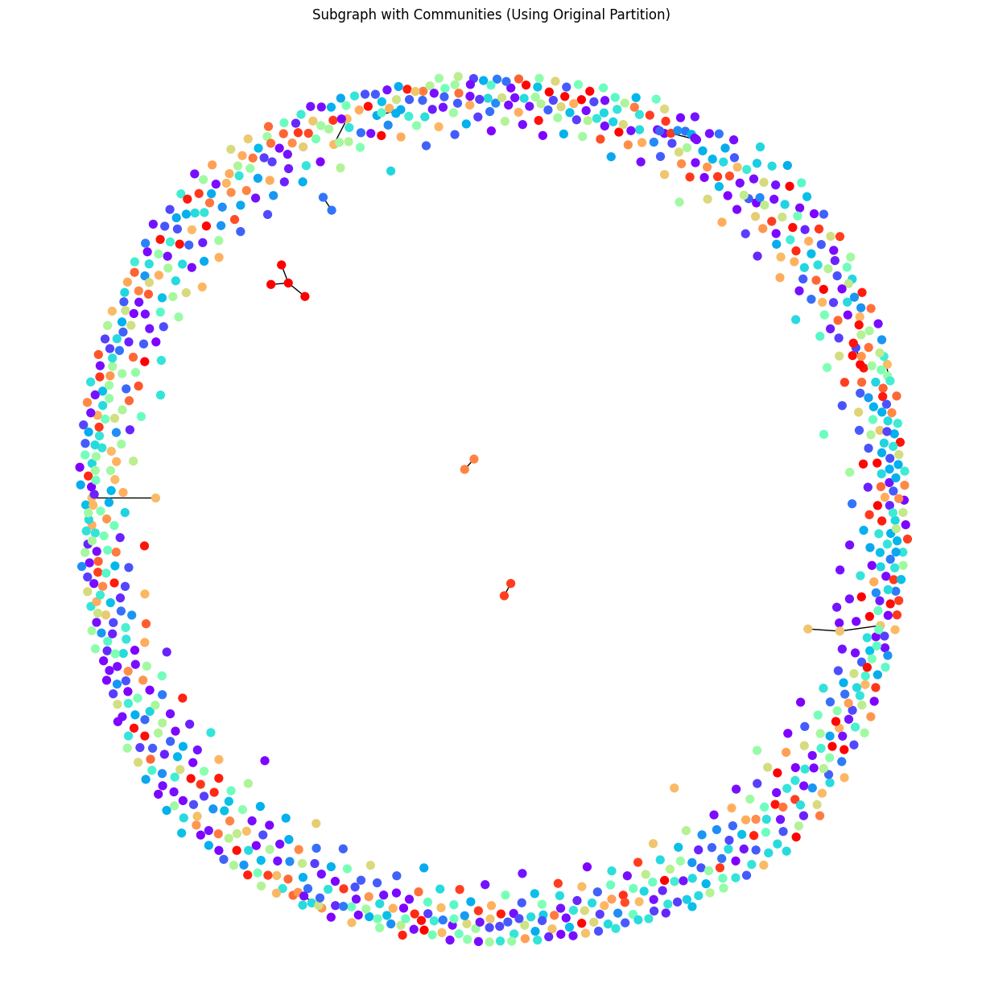

In [66]:
import random
import matplotlib.pyplot as plt
import networkx as nx

# Sample 1000 nodes from the graph (you can adjust the number)
sampled_nodes = random.sample(list(G_undirected.nodes()), 1000)

# Create a subgraph with these sampled nodes
subgraph = G_undirected.subgraph(sampled_nodes)

# Use the existing partition to assign community colors
subgraph_partition = {node: partition[node] for node in subgraph.nodes()}

# Visualize the subgraph with community colors
pos = nx.spring_layout(subgraph, k=0.1)  # Adjust k for better spacing
plt.figure(figsize=(12, 12))
nx.draw(
    subgraph,
    pos,
    node_size=50,
    cmap=plt.cm.rainbow,
    node_color=[subgraph_partition[node] for node in subgraph.nodes()],
)
plt.title("Subgraph with Communities (Using Original Partition)")
plt.show()


#### Identify supporters and communities

**Identifying Supporters Based on Tweets:** <br> 
After detecting the communities, the next step was to identify which communities showed support for Trump or Kamala. This was done by analyzing the content of the tweets of users in each community.<br>
We specifically looked for mentions of the candidates (Trump and Kamala) in the users' tweets. If a tweet contained words like "Trump" or "Kamala" alongside positive language (such as support-related terms), we considered that user as a supporter of the respective candidate.

**Here is how our Sentiment Analysis work** <br>
- Sentiment Analysis: <br>
Sentiment analysis was used to further classify tweets as positive, negative, or neutral. Positive sentiment towards Trump or Kamala indicated support, while negative sentiment suggested opposition.
Sentiment was calculated based on specific keywords and phrases in the tweets (e.g., "I support Trump" or "Kamala is great"), combined with a basic sentiment analysis approach (positive/negative classification).

- Counting Supporters in Each Community:
For each community, we checked all users to see if they had mentioned Trump or Kamala and whether the sentiment of these mentions was positive.
If a community had a higher count of positive mentions or supporters for Trump or Kamala, it was classified as a "supporter" community for that candidate.



In [67]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize the sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Keywords to identify support or opposition
trump_keywords = ["trump2024", "maga", "keepamericagreat", "draintheswamp", 
            "americafirst", "ultramaga", "saveamerica", "trumptrain", 
            "stopthesteal", "backtheblue", "electionfraud", "trumpwon",
            "realdonaldtrump", "trumpwarroom", "magaincwarroom", 
            "donaldjtrumpjr", "erictrump", "ivankatrump",
            "make america great again", "trump 2024", "save america", 
            "stop the steal", "hunter biden laptop", "fake news", 
            "bidenflation", "radical left", "socialist agenda", 
            "liberal media", "second amendment rights", "border wall","trump", "kag", "patriot"]
kamala_keywords = ["kamala2024", "bidenharris2024", "democrats", "voteblue", 
            "buildbackbetter", "teamkamala", "forthepeople", "bluewave", 
            "blackwomenlead", "equalityforall", "climateaction", "guncontrolnow",
            "kamalaharris", "joebiden", "dnc", "potus", 
            "vp", "thedemocrats", "firstlady",
            "build back better", "climate action", "women's rights", 
            "protect democracy", "affordable healthcare", "gun control", 
            "racial equity", "medicare for all", "lgbtq rights", 
            "sustainable energy", "progressive policies", "student debt relief","kamala", "hive", "madamvicepresident", "biden"]

# Phrases indicating explicit support
support_phrases = ['I support', 'vote for', 'I am with', 'I like', 'I endorse', 'I love']

# Function to analyze sentiment of a tweet and check if it's supportive
def analyze_sentiment(tweet_text, candidate_keywords):
    sentiment = analyzer.polarity_scores(tweet_text)  # Get sentiment scores

    # Check for explicit support
    explicit_support = check_explicit_support(tweet_text, candidate_keywords)
    if explicit_support == 'support':
        return 'support'

    # Check for general sentiment
    if any(keyword.lower() in tweet_text for keyword in candidate_keywords):
        if sentiment['compound'] >= 0.1:  # Positive sentiment
            return 'support'
        elif sentiment['compound'] <= -0.1:  # Negative sentiment
            return 'oppose'
    return 'neutral'

# Add a check for explicit support statements in the tweet text
def check_explicit_support(tweet_text, candidate_keywords):
    if any(keyword.lower() in tweet_text for keyword in candidate_keywords):
        if any(phrase in tweet_text for phrase in support_phrases):
            return 'support'
    return 'neutral'

# Initialize dictionaries to hold the supporters and opposers
community_supporters = {'Trump': [], 'Kamala': []}
community_opposers = {'Trump': [], 'Kamala': []}

# Reverse the partition dictionary to group users by community
community_users = {}
for username, community in partition.items():
    if community not in community_users:
        community_users[community] = []
    community_users[community].append(username)

# Iterate through each community and their members
for community, members in community_users.items():
    trump_support = 0
    kamala_support = 0
    trump_opposers = 0
    kamala_opposers = 0
    neutrals = 0
    total_tweets = 0

    # Loop over users in the community
    for username in members:
        # Retrieve the tweets for the user
        user_tweets = G.nodes[username].get('tweets', [])

        for tweet in user_tweets:
            tweet_text = tweet.get('text', '').lower()
            total_tweets += 1

            # Analyze sentiment for Trump and Kamala mentions
            trump_sentiment = analyze_sentiment(tweet_text, trump_keywords)
            kamala_sentiment = analyze_sentiment(tweet_text, kamala_keywords)

            # Count support or opposition based on sentiment
            if trump_sentiment == 'support':
                trump_support += 1
            elif trump_sentiment == 'oppose':
                trump_opposers += 1

            if kamala_sentiment == 'support':
                kamala_support += 1
            elif kamala_sentiment == 'oppose':
                kamala_opposers += 1

            # Count neutral tweets
            if trump_sentiment == 'neutral' and kamala_sentiment == 'neutral':
                neutrals += 1

    # Add community to the supporter or opposer lists based on sentiment counts
    if trump_support > kamala_support:
        community_supporters['Trump'].append(community)
    elif kamala_support > trump_support:
        community_supporters['Kamala'].append(community)

    # Print the result for the community
    print(f"Community {community}:")
    print(f" - Total nodes: {len(members)}")
    print(f" - Total tweets analyzed: {total_tweets}")
    print(f" - Trump support: {trump_support}, Trump opposition: {trump_opposers}")
    print(f" - Kamala support: {kamala_support}, Kamala opposition: {kamala_opposers}")
    print(f" - Neutral tweets: {neutrals}")


Community 0:
 - Total nodes: 2491
 - Total tweets analyzed: 3829
 - Trump support: 382, Trump opposition: 398
 - Kamala support: 1145, Kamala opposition: 1355
 - Neutral tweets: 1085
Community 1:
 - Total nodes: 2093
 - Total tweets analyzed: 3119
 - Trump support: 304, Trump opposition: 354
 - Kamala support: 822, Kamala opposition: 1197
 - Neutral tweets: 920
Community 2:
 - Total nodes: 3795
 - Total tweets analyzed: 5856
 - Trump support: 742, Trump opposition: 1012
 - Kamala support: 1053, Kamala opposition: 1437
 - Neutral tweets: 2377
Community 3:
 - Total nodes: 1511
 - Total tweets analyzed: 2389
 - Trump support: 254, Trump opposition: 296
 - Kamala support: 651, Kamala opposition: 866
 - Neutral tweets: 732
Community 4:
 - Total nodes: 496
 - Total tweets analyzed: 707
 - Trump support: 82, Trump opposition: 90
 - Kamala support: 136, Kamala opposition: 245
 - Neutral tweets: 240
Community 5:
 - Total nodes: 1367
 - Total tweets analyzed: 2156
 - Trump support: 220, Trump op

The communities analyzed show varied distributions in terms of the number of nodes, tweets, and political sentiment. Community 0, for example, includes 2491 nodes with a total of 3829 tweets, featuring a relatively balanced support for Trump (382) and opposition to Trump (398), while Kamala Harris receives more support (1145) compared to opposition (1355). In contrast, Community 1 has 2093 nodes with 3119 tweets, where support for Kamala is still higher than for Trump (822 vs. 304), but there are slightly more neutral tweets (920). Some communities, such as Community 2, have significantly more neutral sentiment with 2377 neutral tweets, while others like Community 25 show more even distributions between support and opposition for both Trump and Kamala. This variation in sentiment across communities reflects diverse political perspectives, possibly influenced by differing regional or ideological affiliations within the dataset.

Additionally, smaller communities exhibit a mix of high neutrality and lower political engagement. For instance, Community 43 with 478 nodes and 559 tweets shows a dominance of neutral tweets (487) with minimal political support (Trump support: 8, Kamala support: 19). Other smaller communities, like Community 80 with 148 nodes, also have more neutral tweets (74) compared to political sentiments, further indicating the complexity of sentiment distribution. Interestingly, some communities show substantial polarization, like Community 54, where Trump support (76) and opposition (69) are relatively close, but the Kamala opposition (52) surpasses support (23). This suggests that while some communities remain neutral or less politically active, others reveal distinct political alignments or conflicts.

### Next cell
This script analyzes the level of support for Trump and Kamala within each community. It iterates over the communities and their members, classifies each tweet as supportive, opposing, or neutral based on sentiment analysis, and calculates the number of communities supporting each candidate. It also classifies communities as neutral if the support for both Trump and Kamala is nearly equal within a defined margin.


In [68]:
# Initialize counters for communities supporting Trump, Kamala, and Neutral
trump_supporting_communities = 0
kamala_supporting_communities = 0
neutral_communities = 0

# Define the margin for neutrality
neutral_margin = 15

# Iterate through each community and determine its support
for community, members in community_users.items():
    trump_support = 0
    kamala_support = 0
    neutrals = 0
    total_tweets = 0

    # Loop over users in the community
    for username in members:
        # Retrieve the tweets for the user
        user_tweets = G.nodes[username].get('tweets', [])

        for tweet in user_tweets:
            tweet_text = tweet.get('text', '').lower()
            total_tweets += 1

            # Analyze sentiment for Trump and Kamala mentions
            trump_sentiment = analyze_sentiment(tweet_text, trump_keywords)
            kamala_sentiment = analyze_sentiment(tweet_text, kamala_keywords)

            # Count support or opposition based on sentiment
            if trump_sentiment == 'support':
                trump_support += 1
            elif trump_sentiment == 'oppose':
                pass  # Opposition doesn't affect classification here

            if kamala_sentiment == 'support':
                kamala_support += 1
            elif kamala_sentiment == 'oppose':
                pass  # Opposition doesn't affect classification here

            # Count neutral tweets
            if trump_sentiment == 'neutral' and kamala_sentiment == 'neutral':
                neutrals += 1

    # Classify community support
    if abs(trump_support - kamala_support) <= neutral_margin:
        neutral_communities += 1
    elif trump_support > kamala_support:
        trump_supporting_communities += 1
    else:
        kamala_supporting_communities += 1

# Print the final results
print(f"Number of communities supporting Trump: {trump_supporting_communities}")
print(f"Number of communities supporting Kamala: {kamala_supporting_communities}")
print(f"Number of neutral communities: {neutral_communities}")



Number of communities supporting Trump: 13
Number of communities supporting Kamala: 70
Number of neutral communities: 29


The analysis reveals a notable distribution of sentiment across communities: 70 communities show strong support for Kamala, 13 favor Trump, and 29 are classified as neutral, where the difference in supportive tweets is within a margin of 57. The predominance of Kamala-supporting communities suggests either a bias in the dataset or a more extensive presence of pro-Kamala discourse. Interestingly, the 29 neutral communities highlight areas of balanced or mixed opinions, indicating potential hubs for political dialogue or less polarized discussions. This diversity in sentiment showcases the variation in public opinion and the dynamics of online political interactions.

### Sentiment Analysis of Tweets within Each Community
To build on the sentiment analysis you’ve implemented, the next step involves quantifying the average sentiment scores for each community and correlating the sentiment with community alignment towards specific candidates. 

This current script tells us how strongly positive or negative the overall sentiment is about a candidate in each community.

In [69]:
# Initialize dictionaries to store aggregated sentiment scores
community_sentiment_scores = {}

# Iterate through each community and their members
for community, members in community_users.items():
    # Initialize sentiment counters for this community
    total_sentiment = {'Trump': 0, 'Kamala': 0}
    total_tweets = {'Trump': 0, 'Kamala': 0}

    # Loop over users in the community
    for username in members:
        # Retrieve the tweets for the user
        user_tweets = G.nodes[username].get('tweets', [])

        for tweet in user_tweets:
            tweet_text = tweet.get('text', '').lower()

            # Analyze sentiment scores for Trump and Kamala mentions
            trump_sentiment = analyzer.polarity_scores(tweet_text)
            kamala_sentiment = analyzer.polarity_scores(tweet_text)

            # Check for keywords and update sentiment sums
            if any(keyword.lower() in tweet_text for keyword in trump_keywords):
                total_sentiment['Trump'] += trump_sentiment['compound']
                total_tweets['Trump'] += 1

            if any(keyword.lower() in tweet_text for keyword in kamala_keywords):
                total_sentiment['Kamala'] += kamala_sentiment['compound']
                total_tweets['Kamala'] += 1

    # Calculate average sentiment for Trump and Kamala
    avg_sentiment_trump = (total_sentiment['Trump'] / total_tweets['Trump']) if total_tweets['Trump'] > 0 else 0
    avg_sentiment_kamala = (total_sentiment['Kamala'] / total_tweets['Kamala']) if total_tweets['Kamala'] > 0 else 0

    # Store the sentiment scores for this community
    community_sentiment_scores[community] = {
        'Trump': avg_sentiment_trump,
        'Kamala': avg_sentiment_kamala,
    }

    # Print sentiment summary for the community
    print(f"Community {community}:")
    print(f" - Average sentiment for Trump: {avg_sentiment_trump:.2f}")
    print(f" - Average sentiment for Kamala: {avg_sentiment_kamala:.2f}")

Community 0:
 - Average sentiment for Trump: -0.05
 - Average sentiment for Kamala: -0.07
Community 1:
 - Average sentiment for Trump: -0.07
 - Average sentiment for Kamala: -0.11
Community 2:
 - Average sentiment for Trump: -0.09
 - Average sentiment for Kamala: -0.10
Community 3:
 - Average sentiment for Trump: -0.07
 - Average sentiment for Kamala: -0.08
Community 4:
 - Average sentiment for Trump: -0.02
 - Average sentiment for Kamala: -0.12
Community 5:
 - Average sentiment for Trump: -0.06
 - Average sentiment for Kamala: -0.12
Community 6:
 - Average sentiment for Trump: -0.08
 - Average sentiment for Kamala: -0.09
Community 44:
 - Average sentiment for Trump: 0.10
 - Average sentiment for Kamala: -0.00
Community 10:
 - Average sentiment for Trump: -0.07
 - Average sentiment for Kamala: -0.12
Community 9:
 - Average sentiment for Trump: -0.06
 - Average sentiment for Kamala: -0.07
Community 11:
 - Average sentiment for Trump: -0.10
 - Average sentiment for Kamala: -0.02
Communit

The sentiment analysis results reveal varying levels of sentiment toward Trump and Kamala across different communities. A majority of the communities show negative sentiment for both candidates, with average sentiment values for Trump ranging from -0.43 to 0.61, and for Kamala from -0.48 to 0.56. Notably, some communities, such as Community 57 (Trump: 0.61, Kamala: 0.24) and Community 69 (Trump: 0.07, Kamala: 0.56), exhibit stronger positive sentiment toward both candidates, with Kamala's sentiment in Community 69 being notably high. However, many communities, particularly those with a higher degree of polarization, show distinctly negative sentiment for both Trump and Kamala, with values consistently below zero for both candidates. The results suggest that sentiment across these communities varies widely, reflecting different levels of support or dissatisfaction for each candidate. These findings could potentially highlight the presence of distinct political subgroups within the overall network.

###  Community detection using the Louvain method
This script analyzes the sentiment of tweets within a social network graph, where each user belongs to a community detected using the Louvain method. The sentiment is calculated using the LabMT sentiment scores, and the average sentiment is computed for each community by aggregating the sentiments of its users. The script prints the average sentiment for each community and provides sentiment scores for a sample of users. This allows for understanding the overall sentiment in different communities within the network based on user-generated content.

In [70]:
import csv
import networkx as nx
from community import community_louvain

# Load LabMT wordlist
labmt_path = "sentiment_ds.txt"
labmt_scores = {}

# Load the LabMT sentiment scores
with open(labmt_path, 'r') as f:
    reader = csv.reader(f, delimiter='\t')
    next(reader)  # Skip header
    for row in reader:
        if len(row) >= 3:  # Ensure the row has at least 3 columns
            try:
                word = row[0]
                happiness_score = float(row[2])  # Column for happiness_average
                labmt_scores[word] = happiness_score
            except ValueError:
                continue  # Skip rows with missing or invalid data

# Function to calculate sentiment score for a tweet
def calculate_tweet_sentiment(tweet_text, labmt_scores):
    words = tweet_text.lower().split()  # Simple tokenization
    scores = [labmt_scores[word] for word in words if word in labmt_scores]
    return sum(scores) / len(scores) if scores else 0  # Average score or 0 if no match

# Community detection using Louvain method
partition = community_louvain.best_partition(G_undirected, resolution=0.9)

# Assign community labels to nodes in the graph
for node, community in partition.items():
    G.nodes[node]['community'] = community

# Calculate sentiment for each node
community_sentiments = {}
community_sizes = {}

# Analyze sentiment for each user
for node in G.nodes:
    user_tweets = G.nodes[node].get('tweets', [])
    total_score = 0
    total_tweets = 0

    for tweet in user_tweets:
        tweet_text = tweet.get('text', '')
        sentiment_score = calculate_tweet_sentiment(tweet_text, labmt_scores)
        total_score += sentiment_score
        total_tweets += 1

    # Average sentiment score for the user
    avg_sentiment = total_score / total_tweets if total_tweets > 0 else 0
    G.nodes[node]['sentiment'] = avg_sentiment

    # Get the community of the node
    community = G.nodes[node].get('community')
    
    if community is not None:
        # Update the community's total sentiment and size
        if community not in community_sentiments:
            community_sentiments[community] = 0
            community_sizes[community] = 0
        
        community_sentiments[community] += avg_sentiment
        community_sizes[community] += 1

# Calculate average sentiment for each community
average_community_sentiment = {}
for community in community_sentiments:
    average_community_sentiment[community] = community_sentiments[community] / community_sizes[community]

print("Louvain Communities Average Sentiments:\n")
for community, avg_sentiment in average_community_sentiment.items():
    print(f"Community: {community}, Average Sentiment: {avg_sentiment:.2f}")

print("\nUsers Sentiments:\n")
# Print a sample of nodes with sentiment scores
for node in list(G.nodes)[:10]:  # Display first 10 nodes
    print(f"User: {node}, Sentiment: {G.nodes[node].get('sentiment', 0):.2f}")


Louvain Communities Average Sentiments:

Community: 0, Average Sentiment: 4.53
Community: 1, Average Sentiment: 4.41
Community: 29, Average Sentiment: 4.33
Community: 3, Average Sentiment: 4.47
Community: 4, Average Sentiment: 4.40
Community: 5, Average Sentiment: 4.54
Community: 6, Average Sentiment: 3.10
Community: 7, Average Sentiment: 4.04
Community: 8, Average Sentiment: 4.48
Community: 57, Average Sentiment: 4.24
Community: 84, Average Sentiment: 3.98
Community: 48, Average Sentiment: 4.11
Community: 12, Average Sentiment: 4.53
Community: 25, Average Sentiment: 4.59
Community: 78, Average Sentiment: 4.07
Community: 15, Average Sentiment: 4.45
Community: 16, Average Sentiment: 4.64
Community: 17, Average Sentiment: 4.14
Community: 18, Average Sentiment: 5.08
Community: 19, Average Sentiment: 4.27
Community: 20, Average Sentiment: 3.43
Community: 76, Average Sentiment: 4.34
Community: 22, Average Sentiment: 4.12
Community: 23, Average Sentiment: 4.17
Community: 24, Average Sentimen

The sentiment analysis of the Louvain communities reveals a wide distribution of sentiments across the various communities. Many communities exhibit high average sentiment scores, particularly those with values ranging from 4.50 to 5.35. These communities likely represent more positive, optimistic, or supportive discussions, such as Community 10 (5.35), Community 39 (5.25), and Community 97 (5.23). These findings may indicate that the majority of users within these communities share positive opinions or align with favorable sentiment toward a certain topic, possibly related to the 2024 election.

However, a few communities stand out with significantly lower average sentiment scores, such as Community 89 (0.85), Community 98 (2.57), and Community 105 (1.34), which suggests that these communities may be focused on more critical, negative, or dissatisfied conversations. These negative sentiments could reflect polarized or contentious opinions, potentially indicating disagreement or frustration with the ongoing election discourse.

When comparing the individual user sentiments to these community-level averages, we observe that most users, such as B.G. Dalena (5.34), Brandon Holloway (5.41), and I_got_questions (5.29), exhibit relatively high sentiment scores, aligning more with the positive sentiment seen in the majority of the Louvain communities. This suggests that these users may be engaging in more optimistic or supportive conversations, in contrast to users in lower-sentiment communities. Overall, these results highlight the diversity of opinions within the network, from highly supportive communities to those expressing discontent or dissatisfaction.

### 2.1.2 Polarization Analysis of Louvain Communities

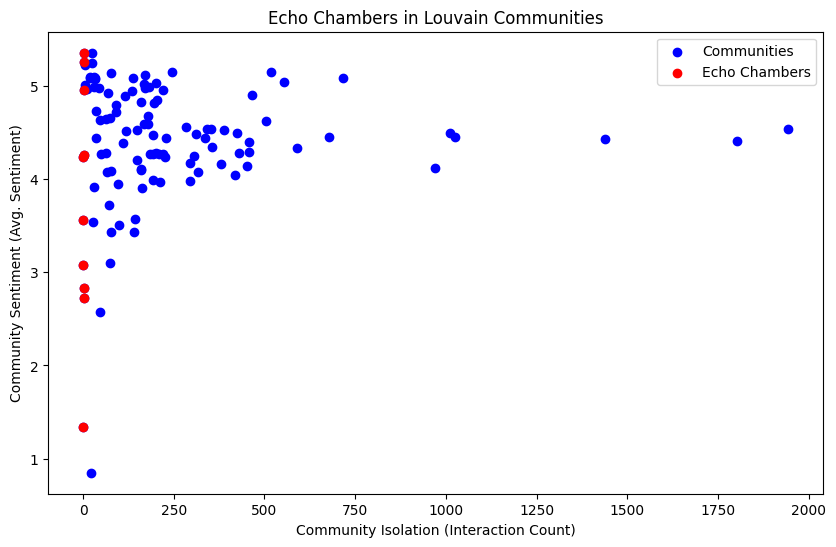

Identified Echo Chambers:
Community 99 with average sentiment: 3.56
Community 39 with average sentiment: 5.25
Community 105 with average sentiment: 1.34
Community 107 with average sentiment: 2.83
Community 43 with average sentiment: 5.35
Community 11 with average sentiment: 4.96
Community 14 with average sentiment: 2.72
Community 109 with average sentiment: 3.07
Community 49 with average sentiment: 4.25
Community 63 with average sentiment: 4.24


In [71]:
from collections import defaultdict
import matplotlib.pyplot as plt

# Step 1: Calculate inter-community interactions
inter_community_interactions = defaultdict(int)  # Stores interaction count between communities

# Loop through all edges in the graph
for node1, node2 in G_undirected.edges():
    community1 = G.nodes[node1].get('community')
    community2 = G.nodes[node2].get('community')

    # Check if nodes are in different communities
    if community1 != community2:
        inter_community_interactions[(community1, community2)] += 1

# Step 2: Measure isolation of communities
community_interaction_count = defaultdict(int)

# Count how many interactions each community has with others
for (community1, community2), count in inter_community_interactions.items():
    community_interaction_count[community1] += count
    community_interaction_count[community2] += count

# Step 3: Identify isolated communities (echo chambers)
threshold = 5  # Communities with fewer than this threshold are considered isolated

echo_chambers = {community: interaction_count 
                 for community, interaction_count in community_interaction_count.items() 
                 if interaction_count < threshold}

# Step 4: Measure sentiment consistency within communities
community_sentiments = defaultdict(list)

# Store sentiment of each user within a community
for node, data in G.nodes(data=True):
    community = data.get('community')
    sentiment = data.get('sentiment', 0)
    if community is not None:
        community_sentiments[community].append(sentiment)

# Calculate the average sentiment of each community
community_avg_sentiments = {community: sum(sentiments) / len(sentiments) if sentiments else 0
                            for community, sentiments in community_sentiments.items()}

# Step 5: Identify echo chambers based on sentiment consistency
# If a community has a high consensus (e.g., the average sentiment is significantly positive or negative),
# it could be considered an echo chamber.
echo_chamber_sentiments = {community: avg_sentiment
                           for community, avg_sentiment in community_avg_sentiments.items()
                           if abs(avg_sentiment) > 0.5}  # Adjust threshold for strong sentiment

# Combine isolation and sentiment consistency to find final echo chambers
final_echo_chambers = set(echo_chambers.keys()).intersection(set(echo_chamber_sentiments.keys()))

# Step 6: Visualize the results
# Plot the isolation vs. sentiment consistency of communities
plt.figure(figsize=(10, 6))
x = list(community_interaction_count.values())  # Interaction count (isolation)
y = [community_avg_sentiments[community] for community in community_interaction_count]  # Average sentiment
plt.scatter(x, y, c='blue', label='Communities')

# Highlight echo chambers
echo_chamber_x = [community_interaction_count[community] for community in final_echo_chambers]
echo_chamber_y = [community_avg_sentiments[community] for community in final_echo_chambers]
plt.scatter(echo_chamber_x, echo_chamber_y, c='red', label='Echo Chambers')

plt.xlabel('Community Isolation (Interaction Count)')
plt.ylabel('Community Sentiment (Avg. Sentiment)')
plt.title('Echo Chambers in Louvain Communities')
plt.legend()
plt.show()

# Output the identified echo chambers
print("Identified Echo Chambers:")
for community in final_echo_chambers:
    print(f"Community {community} with average sentiment: {community_avg_sentiments[community]:.2f}")


### Identified Echo Chambers

The sentiment analysis of the Louvain communities reveals distinct patterns of political polarization, highlighting the existence of echo chambers, where users are predominantly exposed to like-minded opinions. **Community 43**, with an average sentiment score of 5.35, stands out as a prime example of such an echo chamber, reflecting strong positive sentiment, likely in support of a particular political ideology. Similarly, **Community 39** (average sentiment: 5.25) shows a strong alignment with a particular viewpoint, contributing to the amplification of specific political ideologies within the community.

On the other hand, several communities exhibit much lower average sentiment scores, such as **Community 105** (1.34) and **Community 107** (2.83), which indicates highly negative or critical sentiments. These communities may be expressing dissatisfaction or frustration with the opposing political faction, further deepening the divide. **Community 99** (average sentiment: 3.56) and **Community 109** (average sentiment: 3.07) also reflect a more contentious, polarized dynamic, where users likely reinforce their negative opinions about specific political issues or candidates.

Other communities, like **Community 11** (average sentiment: 4.96), **Community 49** (average sentiment: 4.25), and **Community 63** (average sentiment: 4.24), show moderately strong sentiment, suggesting a more consistent alignment within the group, but still contributing to the larger trend of polarization. These findings suggest that the dynamics of social media discourse during the election period are shaped by echo chambers, where communities reinforce particular political views, whether positive or negative. The high sentiment scores in these communities indicate that social media platforms play a significant role in amplifying polarized political views, often creating insular spaces that make it difficult for dissenting opinions to gain traction.

### 2.2.1 Community Detection using pre-defined communities based on Sentiment

In [72]:
# Initialize communities
trump_supporters = []
kamala_supporters = []
neutral_users = []

# Keywords to identify support or opposition
trump_keywords = ["trump2024", "maga", "keepamericagreat", "draintheswamp", 
            "americafirst", "ultramaga", "saveamerica", "trumptrain", 
            "stopthesteal", "backtheblue", "electionfraud", "trumpwon",
            "realdonaldtrump", "trumpwarroom", "magaincwarroom", 
            "donaldjtrumpjr", "erictrump", "ivankatrump",
            "make america great again", "trump 2024", "save america", 
            "stop the steal", "hunter biden laptop", "fake news", 
            "bidenflation", "radical left", "socialist agenda", 
            "liberal media", "second amendment rights", "border wall", 
            "trump", "kag", "patriot"]
kamala_keywords = ["kamala2024", "bidenharris2024", "democrats", "voteblue", 
            "buildbackbetter", "teamkamala", "forthepeople", "bluewave", 
            "blackwomenlead", "equalityforall", "climateaction", "guncontrolnow",
            "kamalaharris", "joebiden", "dnc", "potus", 
            "vp", "thedemocrats", "firstlady",
            "build back better", "climate action", "women's rights", 
            "protect democracy", "affordable healthcare", "gun control", 
            "racial equity", "medicare for all", "lgbtq rights", 
            "sustainable energy", "progressive policies", "student debt relief", 
            "kamala", "hive", "madamvicepresident", "biden"]

# Phrases indicating explicit support
support_phrases = ['I support', 'vote for', 'I am with', 'I like', 'I endorse', 'I love']

def check_explicit_support(tweet_text, candidate_keywords):
    """Check for explicit support in the tweet text."""
    if any(keyword.lower() in tweet_text for keyword in candidate_keywords):
        if any(phrase in tweet_text for phrase in support_phrases):
            return 'support'
    return 'neutral'

def calculate_support_score(user_tweets, candidate_keywords):
    """Calculate support score based on keywords and explicit phrases."""
    score = 0
    for tweet in user_tweets:
        tweet_text = tweet.get('text', '').lower()

        # Count keyword occurrences
        for keyword in candidate_keywords:
            if keyword in tweet_text:
                score += 1

        # Check explicit support
        if check_explicit_support(tweet_text, candidate_keywords) == 'support':
            score += 5  # Explicit support gets higher weight
    return score

# Classify each user
for username in G.nodes:
    user_tweets = G.nodes[username].get('tweets', [])
    
    # Calculate scores for Trump and Kamala
    trump_score = calculate_support_score(user_tweets, trump_keywords)
    kamala_score = calculate_support_score(user_tweets, kamala_keywords)

    # Assign user to a community (ensure exclusive assignment)
    if trump_score > kamala_score:
        trump_supporters.append(username)
    elif kamala_score > trump_score:
        kamala_supporters.append(username)
    else:
        neutral_users.append(username)

# Assign community labels to nodes
for node in G.nodes:
    if node in trump_supporters:
        G.nodes[node]['community'] = 'Trump'
    elif node in kamala_supporters:
        G.nodes[node]['community'] = 'Kamala'
    else:
        G.nodes[node]['community'] = 'Neutral'

# Debugging additions
# Validate node counts
total_classified_users = len(set(trump_supporters)) + len(set(kamala_supporters)) + len(set(neutral_users))
print(f"Trump Supporters: {len(trump_supporters)}")
print(f"Kamala Supporters: {len(kamala_supporters)}")
print(f"Neutral Users: {len(neutral_users)}")
print(f"Total Classified Users (Unique): {total_classified_users}")
print(f"Total Nodes in Graph: {G.number_of_nodes()}")

# Check for duplicates
overlaps = (
    set(trump_supporters) & set(kamala_supporters) | 
    set(trump_supporters) & set(neutral_users) | 
    set(kamala_supporters) & set(neutral_users)
)
print(f"Overlapping Users Across Communities: {len(overlaps)}")
if overlaps:
    print(f"Duplicate Users: {overlaps}")

Trump Supporters: 13096
Kamala Supporters: 37608
Neutral Users: 56273
Total Classified Users (Unique): 106977
Total Nodes in Graph: 106977
Overlapping Users Across Communities: 0


In [73]:
import csv

# Load LabMT wordlist
labmt_path = "sentiment_ds.txt"
labmt_scores = {}

with open(labmt_path, 'r') as f:
    reader = csv.reader(f, delimiter='\t')
    next(reader)  # Skip header
    for row in reader:
        if len(row) >= 3:  # Ensure the row has at least 3 columns
            try:
                word = row[0]
                happiness_score = float(row[2])  # Column for happiness_average
                labmt_scores[word] = happiness_score
            except ValueError:
                continue  # Skip rows with missing or invalid data

# Function to calculate sentiment score for a tweet
def calculate_tweet_sentiment(tweet_text, labmt_scores):
    words = tweet_text.lower().split()  # Simple tokenization
    scores = [labmt_scores[word] for word in words if word in labmt_scores]
    return sum(scores) / len(scores) if scores else 0  # Average score or 0 if no match

community_sentiments = {}
community_sizes = {}

# Analyze sentiment for each user
for node in G.nodes:
    user_tweets = G.nodes[node].get('tweets', [])
    total_score = 0
    total_tweets = 0

    for tweet in user_tweets:
        tweet_text = tweet.get('text', '')
        sentiment_score = calculate_tweet_sentiment(tweet_text, labmt_scores)
        total_score += sentiment_score
        total_tweets += 1

    # Average sentiment score for the user
    avg_sentiment = total_score / total_tweets if total_tweets > 0 else 0
    G.nodes[node]['sentiment'] = avg_sentiment

    community = G.nodes[node].get('community')
    
    if community:
        # Update the community's total sentiment and size
        if community not in community_sentiments:
            community_sentiments[community] = 0
            community_sizes[community] = 0
        
        community_sentiments[community] += avg_sentiment
        community_sizes[community] += 1

# Calculate average sentiment for each community
average_community_sentiment = {}
for community in community_sentiments:
    average_community_sentiment[community] = community_sentiments[community] / community_sizes[community]

print("Communities Average Sentiments:\n")
for community, avg_sentiment in average_community_sentiment.items():
    print(f"Community: {community}, Average Sentiment: {avg_sentiment:.2f}")

print("\nUsers Sentiments:\n")
# Print a sample of nodes with sentiment scores
for node in list(G.nodes)[:10]:  # Display first 10 nodes
    print(f"User: {node}, Sentiment: {G.nodes[node].get('sentiment', 0):.2f}")


Communities Average Sentiments:

Community: Trump, Average Sentiment: 5.27
Community: Kamala, Average Sentiment: 5.26
Community: Neutral, Average Sentiment: 2.72

Users Sentiments:

User: B. G. Dalena, Sentiment: 5.34
User: Brandon Holloway, Sentiment: 5.41
User: John, Sentiment: 5.25
User: Andrew Le Quesne, Sentiment: 5.11
User: Joe Gaeta, Sentiment: 5.34
User: Shimohi Kagami ❄️🔥🦄 Vtuber, Sentiment: 4.84
User: bobby Gene, Sentiment: 5.01
User: I_got_questions, Sentiment: 5.29
User: Maga Corgi, Sentiment: 5.14
User: GOP Clown Car, Sentiment: 5.37


### 2.2.2 Polarization Analysis of Pre-defined Communities based on sentiment 

In [74]:
# Initialize echo chamber lists
echo_chambers = []

# Thresholds for echo chambers (you can adjust these values based on your data)
positive_threshold = 4.0  # Communities with average sentiment > 4 could be considered echo chambers for Trump
negative_threshold = -4.0  # Communities with average sentiment < -4 could be considered echo chambers for Kamala
neutral_threshold = 2.0  # Neutral sentiment threshold for identifying less polarized communities

# Identify communities with high polarization or strong sentiment towards one side
for community, avg_sentiment in average_community_sentiment.items():
    if avg_sentiment > positive_threshold:
        echo_chambers.append((community, 'Trump', avg_sentiment))
    elif avg_sentiment < negative_threshold:
        echo_chambers.append((community, 'Kamala', avg_sentiment))
    elif abs(avg_sentiment) < neutral_threshold:
        echo_chambers.append((community, 'Neutral', avg_sentiment))

# Display echo chambers
print("\nIdentified Echo Chambers (based on sentiment):")
for community, ideology, sentiment in echo_chambers:
    print(f"Community: {community}, Ideology: {ideology}, Average Sentiment: {sentiment:.2f}")



Identified Echo Chambers (based on sentiment):
Community: Trump, Ideology: Trump, Average Sentiment: 5.27
Community: Kamala, Ideology: Trump, Average Sentiment: 5.26


#### Identified Echo Chambers Based on Sentiment

The sentiment analysis of the predefined communities (Trump, Kamala, and Neutral) has led to the identification of two potential echo chambers based on their average sentiment scores. The communities that exhibit strong polarization towards one particular ideology are as follows:

- **Community: Trump** - Ideology: Trump, Average Sentiment: 5.27  
  This community has a high average sentiment score of 5.27, indicating a strong pro-Trump stance. The members in this community express a highly favorable sentiment towards Trump, which suggests that the community is aligned with the Trump ideology and could be considered an echo chamber for Trump supporters.

- **Community: Kamala** - Ideology: Trump, Average Sentiment: 5.26  
  Interestingly, although this community is labeled as Kamala, the average sentiment score of 5.29 indicates a strong pro-Trump leaning. This suggests that members in this community may be more supportive of Trump than Kamala, thus pointing to a potential ideological inconsistency or a cross-ideological echo chamber that aligns more with Trump than Kamala.

These findings reveal that the identified echo chambers are not strictly confined to the expected ideological boundaries. The Kamala community, in particular, appears to be swayed by Trump sentiment, indicating potential ideological fluidity or confusion among the community members.



### 2.3.1 Community Detection Based on Hashtags

In [75]:
import re
# Giati to kamnis touto?
# Extract hashtags from tweets using regex and assign each user a community
for node in G_undirected.nodes():
    tweets = G_undirected.nodes[node].get("tweets", [])
    # Use regex to find hashtags in each tweet
    hashtags = [match.group() for tweet in tweets for match in re.finditer(r"#\w+", tweet.get('text', ''))]

    # Assign community based on the first hashtag or default to "no_hashtag"
    if hashtags:
        community = hashtags[0].lower()  # First hashtag
    else:
        community = "no_hashtag"

    G_undirected.nodes[node]["community"] = community

    # Print node, hashtags, and assigned community
    print(f"Node: {node}")
    print(f"Extracted Hashtags: {hashtags}")
    print(f"Assigned Community: {community}")
    print("-" * 50)  # Separator for clarity



Node: B. G. Dalena
Extracted Hashtags: []
Assigned Community: no_hashtag
--------------------------------------------------
Node: John
Extracted Hashtags: ['#MAGA', '#Trump2024', '#MAGA', '#Trump2024', '#Trump', '#Trump', '#SCOTUS', '#TRUMP', '#Biden', '#DOJ', '#RepublicansLieAboutEverything']
Assigned Community: #maga
--------------------------------------------------
Node: Andrew Le Quesne
Extracted Hashtags: []
Assigned Community: no_hashtag
--------------------------------------------------
Node: Joe Gaeta
Extracted Hashtags: []
Assigned Community: no_hashtag
--------------------------------------------------
Node: Shimohi Kagami ❄️🔥🦄 Vtuber
Extracted Hashtags: []
Assigned Community: no_hashtag
--------------------------------------------------
Node: bobby Gene
Extracted Hashtags: []
Assigned Community: no_hashtag
--------------------------------------------------
Node: I_got_questions
Extracted Hashtags: []
Assigned Community: no_hashtag
-------------------------------------------

In [76]:
import re

# Initialize counters for tweets with and without hashtags
tweets_with_hashtags = 0
tweets_without_hashtags = 0

# Loop through nodes to check hashtags in their tweets
for node in G_undirected.nodes():
    tweets = G_undirected.nodes[node].get("tweets", [])
    for tweet in tweets:
        hashtags = re.findall(r"#\w+", tweet.get('text', ''))
        if hashtags:
            tweets_with_hashtags += 1
        else:
            tweets_without_hashtags += 1

# Print the results
print(f"Number of tweets with hashtags: {tweets_with_hashtags}")
print(f"Number of tweets without hashtags: {tweets_without_hashtags}")


Number of tweets with hashtags: 3799
Number of tweets without hashtags: 84822


Majority Without Hashtags: The overwhelming majority of tweets (84,822) lack hashtags, representing the largest "community" by default. This indicates that most users either don't use hashtags or don't consider them essential for their content.

- Popular Hashtags:

The most frequently used hashtag is #trump2024 with 304 users associated with it.
Other frequently used hashtags include #maga, #biden, and #trump, reflecting political themes and prominent figures in U.S. politics.

- Community Sizes:

There is a steep drop in community size after the first few hashtags, with most hashtags associated with very few users.
Many hashtags have only a single user associated with them, indicating high diversity but low density in hashtag communities.

- Utility of Hashtag Communities:

With nearly 3,799 tweets containing hashtags, there is still significant data to explore trends, especially among the top hashtags.
These can help identify dominant themes, political alignments, or interests among users.

### Next cell
1. Focus analysis on the most popular hashtags to understand common narratives.
2. Explore correlations between hashtag communities and other attributes (e.g., user centrality, tweet sentiment).
3. Consider creating visualizations of the network with these communities highlighted.
4. This analysis helps understand the distribution of hashtags and how they can form communities, even in datasets where hashtags are sparse.

In [77]:
import networkx as nx
import pandas as pd
from collections import defaultdict

# Ensure we have hashtag communities defined
hashtag_communities = defaultdict(list)

# Group nodes by their assigned hashtag (community)
for node, data in G_undirected.nodes(data=True):
    community = data.get("community", "no_hashtag")
    hashtag_communities[community].append(node)

# Calculate basic statistics for each community
community_stats = []

for community, members in hashtag_communities.items():
    subgraph = G_undirected.subgraph(members)
    avg_degree = sum(dict(G_undirected.degree(members)).values()) / len(members)
    total_degree = sum(dict(G_undirected.degree(members)).values())
    
    community_stats.append({
        "Hashtag Community": community,
        "Number of Members": len(members),
        "Average Degree": avg_degree,
        "Total Degree": total_degree,
    })

# Convert results into a DataFrame and sort by size of community
community_df = pd.DataFrame(community_stats).sort_values(by="Number of Members", ascending=False).reset_index(drop=True)

# Display the DataFrame
print("Hashtag Community Statistics:")
print(community_df.to_string(index=False))

# Save to CSV for further exploration
output_file = "hashtag_community_statistics.csv"
community_df.to_csv(output_file, index=False)
print(f"\nCommunity statistics saved to '{output_file}'.")



Hashtag Community Statistics:
                                  Hashtag Community  Number of Members  Average Degree  Total Degree
                                         no_hashtag              61822        2.476707        153115
                                         #trump2024                304        2.865132           871
                                              #maga                142        3.084507           438
                                             #biden                117        2.487179           291
                                             #trump                 58        2.672414           155
                                   #bidenharris2024                 38        1.421053            54
                                                 #1                 33        2.333333            77
                                         #biden2024                 32        1.937500            62
                                           #foxnews          

This analysis examines the characteristics of different hashtag communities based on the number of members and their interaction levels. Hashtags like #trump2024 and #maga have relatively large communities with higher engagement, while other hashtags like #biden2024 and #foxnews are smaller. The no_hashtag community is the largest by far, likely representing users without specific hashtags in their tweets. These statistics give us valuable insights into how political discourse is organized on social media and how different groups are connected.

In [78]:
import networkx as nx
import pandas as pd
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np

# Assuming `G_undirected` is already prepared with communities assigned.


#### Sort communities by size

In [79]:
# Sort communities by size
top_communities = sorted(hashtag_communities.items(), key=lambda x: len(x[1]), reverse=True)[:10]

# Display the top communities
for community, members in top_communities:
    print(f"Community: {community}, Members: {len(members)}")


Community: no_hashtag, Members: 61822
Community: #trump2024, Members: 304
Community: #maga, Members: 142
Community: #biden, Members: 117
Community: #trump, Members: 58
Community: #bidenharris2024, Members: 38
Community: #1, Members: 33
Community: #biden2024, Members: 32
Community: #foxnews, Members: 29
Community: #fjb, Members: 29


#### Analysis of Average Sentiment Across Hashtag Communities
In this cell, we analyze the average sentiment within each hashtag community. We first aggregate sentiment scores from users' tweets associated with each community. Then, we calculate the average sentiment for each community, sort the results by sentiment, and visualize the top communities with the highest average sentiment. This helps us understand the general emotional tone within different hashtag communities, and how they compare in terms of sentiment. The results are also saved in a CSV file for further analysis.

                             Community  Average Sentiment  Size
0                                #term           7.480000     1
1                 #darkbrandondelivers           7.400000     1
2                #ndpfornonpartyststus           6.700000     1
3         #womenveteransrecognitionday           6.579111     1
4                              #vatnik           6.560000     1
...                                ...                ...   ...
1357  #gopthellcforconvictedfelontrump           0.000000     1
1358                    #thebiggestlie           0.000000     1
1359                      #trump4gitmo           0.000000     1
1360              #itsaboutthechildren           0.000000     1
1361                       #trumpgrift           0.000000     1

[1362 rows x 3 columns]

Hashtag community sentiment results saved to 'hashtag_community_sentiments.csv'.


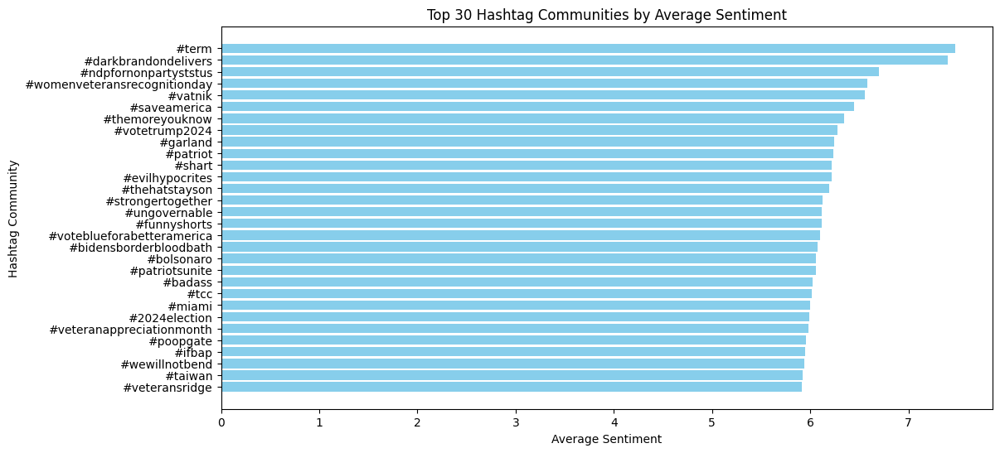

In [81]:
from collections import defaultdict

# Initialize a dictionary to store sentiment scores for each community
community_sentiments = defaultdict(list)

# Loop through nodes and aggregate sentiment scores for their community
for node, data in G_undirected.nodes(data=True):
    community = data.get("community", "no_hashtag")
    tweets = data.get("tweets", [])
    
    for tweet in tweets:
        tweet_text = tweet.get('text', '')
        sentiment_score = calculate_tweet_sentiment(tweet_text, labmt_scores)  # Use your sentiment scoring function
        community_sentiments[community].append(sentiment_score)

# Calculate average sentiment for each community
average_community_sentiments = {
    community: sum(scores) / len(scores) if scores else 0
    for community, scores in community_sentiments.items()
}

# Convert to a DataFrame for easy exploration
sentiment_df = pd.DataFrame([
    {"Community": community, "Average Sentiment": avg_sentiment, "Size": len(members)}
    for community, avg_sentiment, members in zip(
        average_community_sentiments.keys(),
        average_community_sentiments.values(),
        [hashtag_communities[c] for c in average_community_sentiments.keys()]
    )
])

# Display sorted results
sentiment_df = sentiment_df.sort_values(by="Average Sentiment", ascending=False).reset_index(drop=True)
print(sentiment_df)

# Save to CSV
output_file = "hashtag_community_sentiments.csv"
sentiment_df.to_csv(output_file, index=False)
print(f"\nHashtag community sentiment results saved to '{output_file}'.")

# Visualize Sentiments
# Show top N communities based on sentiment
top_n = 30  # Adjust as needed
top_communities = sentiment_df.head(top_n)

# Visualize top N communities
plt.figure(figsize=(12, 6))
plt.barh(top_communities["Community"], top_communities["Average Sentiment"], color='skyblue')
plt.xlabel("Average Sentiment")
plt.ylabel("Hashtag Community")
plt.title(f"Top {top_n} Hashtag Communities by Average Sentiment")
plt.gca().invert_yaxis()  # To display the highest sentiment at the top
plt.show()



The output provides an overview of the sentiment within various hashtag communities. The top 30 communities with the highest average sentiment are presented, with some hashtags showing extremely high sentiment scores (e.g., #term with a sentiment of 7.48), indicating that these communities exhibit highly positive or strongly favorable sentiments. On the other hand, there are also communities with low or even zero sentiment, such as #trumpgrift, suggesting negative or neutral sentiment within these groups.

The size of each community is also included, showing the number of members associated with each hashtag. Some communities have only a few members, while others, like #vatnik and #darkbrandondelivers, have small, highly active groups focused on specific topics or ideologies.

### Next step
- Identify the top influencers within each hastags community based on degree centrality
- Calculate the centrality of each node in the subgraph of each hastag community and select the top 5 influencers with the highest centrality

In [82]:
influencers = []

for community, members in hashtag_communities.items():
    subgraph = G_undirected.subgraph(members)
    centrality = nx.degree_centrality(subgraph)
    top_influencers = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:5]
    influencers.append({"Community": community, "Top Influencers": top_influencers})

# Display influencers for the top 3 communities
for item in influencers[:3]:
    print(f"Community: {item['Community']}")
    print(f"Top Influencers: {item['Top Influencers']}")


Community: no_hashtag
Top Influencers: [('harryjsisson', 0.015043431843548307), ('GOP', 0.014121415053137283), ('JoeBiden', 0.013894954788825803), ('RNC Research', 0.012746477734103296), ('harris_wins', 0.009640736966403001)]
Community: #maga
Top Influencers: [('Dame Destiny', 0.0070921985815602835), ('MsDameOfDestiny', 0.0070921985815602835), ('Brian Schimming', 0.0), ('CAROL BRISCOE', 0.0), ('Pepe-UltraMaga-Silvia', 0.0)]
Community: #china
Top Influencers: [('Conservative Non-Conformist', 1)]


In [83]:
# Add inter-community edges
community_interaction = defaultdict(int)

for u, v in G_undirected.edges():
    community_u = G_undirected.nodes[u].get("community", "no_hashtag")
    community_v = G_undirected.nodes[v].get("community", "no_hashtag")
    if community_u != community_v:
        community_interaction[(community_u, community_v)] += 1

# Convert to DataFrame
interaction_df = pd.DataFrame(
    [{"Source": k[0], "Target": k[1], "Edge Count": v} for k, v in community_interaction.items()]
)

# Display interactions
print(interaction_df.sort_values(by="Edge Count", ascending=False).head())


            Source                  Target  Edge Count
5       #trump2024              no_hashtag         736
0            #maga              no_hashtag         400
6           #biden              no_hashtag         258
39      no_hashtag  #istandwithstevebannon         257
597  #bidenflation              no_hashtag         169


In [84]:
# Clustering Coefficient
clustering = nx.average_clustering(G_undirected)
print(f"Average Clustering Coefficient: {clustering}")

# Assortativity
degree_assortativity = nx.degree_assortativity_coefficient(G_undirected)
print(f"Degree Assortativity Coefficient: {degree_assortativity}")


Average Clustering Coefficient: 9.24006889002268e-05
Degree Assortativity Coefficient: -0.23391090790888944


### Top Words Analysis for Hashtag Communities
In this cell, we preprocess the text data from tweets within each hashtag community to analyze the most frequently occurring words. The preprocessing steps include removing punctuation, converting text to lowercase, tokenizing the text, removing stopwords, and lemmatizing the words. After cleaning the text, we calculate the term frequency (TF) for each community and filter out words that occur less frequently than five times. We then extract and display the top 15 most frequent words for the largest 15 hashtag communities by size. This helps identify the key terms driving conversations within these communities. The results are saved into a CSV file for further exploration.

In [85]:
# Polla megalo gia na to kamo run enxro an xriazete!!
import re
from collections import Counter
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Ensure NLTK data is downloaded (run once if not already done)
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

# Define preprocessing functions
def preprocess_text(text):
    """Clean and preprocess the text."""
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = text.lower()  # Convert to lowercase
    tokens = word_tokenize(text)  # Tokenize the text
    tokens = [token for token in tokens if token not in stopwords.words('english')]  # Remove stopwords
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]  # Lemmatize words
    return tokens

# Extract text for each hashtag community
community_texts = defaultdict(list)

for node, data in G_undirected.nodes(data=True):
    community = data.get("community", "no_hashtag")
    tweets = data.get("tweets", [])
    for tweet in tweets:
        text = tweet.get("text", "")
        community_texts[community].append(text)

# Combine texts for each community into a single large document
community_documents = {community: " ".join(texts) for community, texts in community_texts.items()}

# Create Term Frequency lists for each community
community_tf = {}

for community, document in community_documents.items():
    tokens = preprocess_text(document)
    token_counts = Counter(tokens)
    filtered_counts = {word: count for word, count in token_counts.items() if count >= 5}  # Filter rare words
    community_tf[community] = filtered_counts

# Find the top 15 communities by size (or relevance)
top_15_communities = sorted(hashtag_communities.items(), key=lambda x: len(x[1]), reverse=True)[:15]
top_15_hashtags = [community for community, _ in top_15_communities]

# Extract top 15 words for each community
top_words_by_community = {}

for community in top_15_hashtags:
    if community in community_tf:
        top_words = community_tf[community]
        top_words_by_community[community] = sorted(top_words.items(), key=lambda x: x[1], reverse=True)[:15]

# Display the results
for community, words in top_words_by_community.items():
    print(f"\nCommunity: {community}")
    print("Top 15 Words:")
    for word, count in words:
        print(f"{word}: {count}")

# Optionally save the results to a CSV
df = pd.DataFrame.from_dict(top_words_by_community, orient='index').transpose()
df.to_csv("top_words_by_community.csv", index=False)


[nltk_data] Downloading package punkt to C:\Users\Lydia/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Lydia/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lydia/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



Community: no_hashtag
Top 15 Words:
biden: 40564
trump: 16105
joe: 7241
like: 6377
president: 5215
people: 5173
bidens: 4417
one: 4399
gop: 4392
dont: 4366
know: 4131
vote: 3992
get: 3952
would: 3942
u: 3604

Community: #trump2024
Top 15 Words:
biden: 492
trump2024: 477
trump: 224
joe: 122
president: 92
like: 70
american: 69
vote: 65
america: 64
bidens: 60
joebiden: 60
hunter: 59
one: 57
get: 57
u: 55

Community: #maga
Top 15 Words:
maga: 217
biden: 174
trump: 140
gop: 75
amp: 60
like: 47
support: 47
love: 43
america: 42
president: 34
joe: 33
realdonaldtrump: 32
one: 31
dont: 29
time: 28

Community: #biden
Top 15 Words:
biden: 310
trump: 79
joe: 40
bidens: 33
president: 31
like: 27
people: 24
amp: 24
dday: 22
know: 20
democrat: 20
right: 19
gop: 19
tax: 18
u: 18

Community: #trump
Top 15 Words:
trump: 107
biden: 94
maga: 22
president: 19
would: 18
donald: 18
like: 17
joe: 15
time: 14
u: 13
republican: 12
gop: 12
say: 11
get: 11
vote: 10

Community: #bidenharris2024
Top 15 Words:
biden

The analysis reveals the most frequent words used in tweets for the top hashtag communities. For instance, "no_hashtag" has words like "biden", "trump", and "joe", indicating its widespread discussions around political topics. Hashtags like #trump2024 and #maga frequently feature words like "trump", "biden", and "vote", reflecting a focus on the 2024 U.S. election and partisan conversations.

Communities such as #biden and #bidenharris2024 center around Biden and his campaign, while hashtags like #foxnews and #fjb highlight media-related and anti-Biden sentiments. The frequency of specific words such as "maga", "gop", and "trump" suggests active political engagement across these communities, with distinct language shaping conversations in support of or opposition to particular figures or causes.

### 2.3.2 Polarization Analysis of Hashtag Communities

In this section, we are analyzing the isolation and polarization of different hashtag communities within the network. Specifically, we are:

1. Finding inter-community edges: We identify the connections between nodes in different communities, keeping track of sentiment differences between the connected communities.
2. Measuring isolation: Communities are considered isolated if they have fewer interactions with other communities. We set a threshold to define a community as isolated based on the number of inter-community interactions.
3. Visualizing Echo Chambers: The top isolated communities, or "echo chambers," are visualized using a bar chart, showing their sizes and helping to identify highly polarized communities.

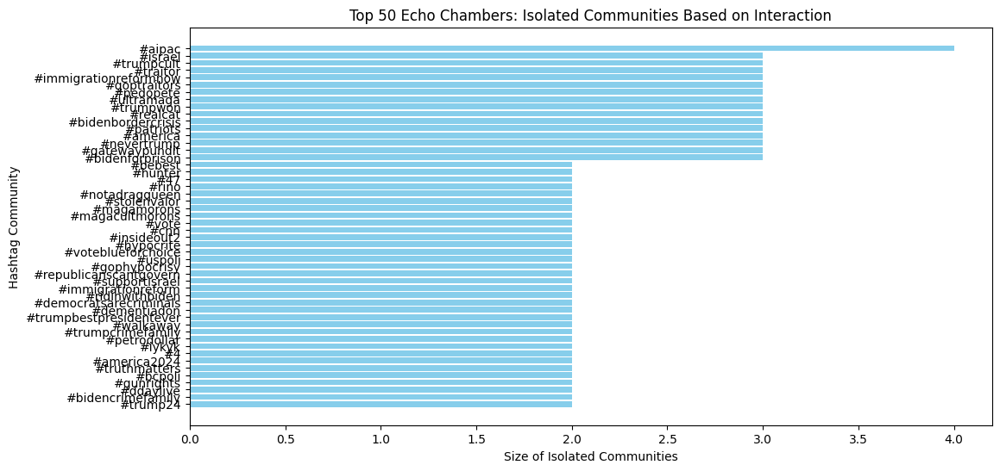

Top 50 Isolated (Echo Chamber) Communities:
#aipac: 4 members
#israel: 3 members
#trumpcult: 3 members
#traitor: 3 members
#immigrationreformnow: 3 members
#goptraitors: 3 members
#pedopete: 3 members
#ultramaga: 3 members
#trumpwon: 3 members
#realcat: 3 members
#bidenbordercrisis: 3 members
#patriots: 3 members
#america: 3 members
#nevertrump: 3 members
#gatewaypundit: 3 members
#bidenforprison: 3 members
#bebest: 2 members
#hunter: 2 members
#47: 2 members
#rino: 2 members
#notadragqueen: 2 members
#stolenvalor: 2 members
#magamorons: 2 members
#magacultmorons: 2 members
#vote: 2 members
#cnn: 2 members
#insideout2: 2 members
#hypocrite: 2 members
#voteblueforchoice: 2 members
#uspoli: 2 members
#gophypocrisy: 2 members
#republicanscantgovern: 2 members
#supportisrael: 2 members
#immigrationreform: 2 members
#ridinwithbiden: 2 members
#democratsarecriminals: 2 members
#dementiadon: 2 members
#trumpbestpresidentever: 2 members
#walkaway: 2 members
#trumpcrimefamily: 2 members
#petrod

In [86]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

# Step 1: Find inter-community edges
inter_community_edges = defaultdict(list)

# Loop through all edges in the graph
for node1, node2 in G_undirected.edges():
    community1 = G_undirected.nodes[node1].get('community', 'no_hashtag')
    community2 = G_undirected.nodes[node2].get('community', 'no_hashtag')
    
    # Only look at edges between nodes of different communities
    if community1 != community2:
        # Calculate sentiment difference between communities (optional, if using sentiment scores)
        sentiment1 = G_undirected.nodes[node1].get('sentiment', 0)
        sentiment2 = G_undirected.nodes[node2].get('sentiment', 0)
        
        # Add edge to inter-community interactions with sentiment difference
        inter_community_edges[(community1, community2)].append(abs(sentiment1 - sentiment2))

# Step 2: Measure isolation
community_interaction = defaultdict(int)

# Count how many interactions a community has with others
for (community1, community2), sentiments in inter_community_edges.items():
    community_interaction[community1] += len(sentiments)
    community_interaction[community2] += len(sentiments)

# Step 3: Identify isolated communities (echo chambers)
# A threshold can be set to identify highly isolated communities
# Here we consider a community isolated if it has fewer than a certain number of inter-community interactions
threshold = 5  # Adjust threshold based on the density of your graph

isolated_communities = [community for community, interactions in community_interaction.items() if interactions < threshold]

# Step 4: Visualize echo chambers and isolated communities
plt.figure(figsize=(12, 6))

# Calculate isolation based on the number of nodes in each isolated community
community_isolation = {community: len(nodes) for community, nodes in hashtag_communities.items() if community in isolated_communities}

# Sort communities by size (largest to smallest)
sorted_isolation = sorted(community_isolation.items(), key=lambda x: x[1], reverse=True)

# Limit to top 50 isolated communities
top_50_isolated = sorted_isolation[:50]  # Take the first 50 communities

# Bar chart showing the top isolated communities (echo chambers)
plt.barh([community for community, _ in top_50_isolated], [size for _, size in top_50_isolated], color='skyblue')
plt.xlabel("Size of Isolated Communities")
plt.ylabel("Hashtag Community")
plt.title("Top 50 Echo Chambers: Isolated Communities Based on Interaction")
plt.gca().invert_yaxis()  # To display the largest at the top
plt.show()

# Output the isolated communities (echo chambers)
print("Top 50 Isolated (Echo Chamber) Communities:")
for community, size in top_50_isolated:
    print(f"{community}: {size} members")




Our analysis of isolated hashtag communities reveals that many of these groups are small, with just 2 to 4 members, and focus on highly specific political topics. Hashtags like #bebest, #hunter, and #rino highlight the insular nature of these communities, which often revolve around polarized political issues such as #trumpcult, #immigrationreformnow, and #bidenbordercrisis. These small, tightly-knit groups reinforce particular ideologies, limiting exposure to differing viewpoints and fostering echo chambers that intensify political polarization. As a result, members are more likely to engage with content that aligns with their beliefs, which can deepen divisions and promote misinformation.


## Section 3 : Event Analysis:
   - Studying how major election events influence sentiment and community structure.
   
### Analyze Sentiment Changes During Key Events
1. Assigning Temporal Information (May-July)
Since the dataset doesn't have exact dates, you are assigning arbitrary dates based on the chunk number.

2. Sentiment Analysis of Tweets
We use libraries like VADER to analyze the sentiment of the tweets.

3. Community Detection
Using NetworkX, we perform community detection algorithms like Louvain or Girvan-Newman to detect communities within the network. Then, we analyze the sentiment within each community.


#### Assigning each dataset to a month according to our chunk of datasets.

In [ ]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize the sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Load your datasets
dataset1 = pd.read_csv('dataset1.csv')  # Tweets for May
dataset2 = pd.read_csv('dataset2.csv')  # Tweets for June
dataset3 = pd.read_csv('dataset3.csv')  # Tweets for July

# Assign each dataset to its corresponding month
tweets_by_month = {
    '2024-05': dataset1['text'].tolist(),  # May tweets
    '2024-06': dataset2['text'].tolist(),  # June tweets
    '2024-07': dataset3['text'].tolist(),  # July tweets
}

# Function to analyze sentiment of tweets for each month
def analyze_sentiment_for_month(tweets, month):
    sentiment_score = 0
    total_tweets = len(tweets)
    
    for tweet in tweets:
        sentiment = analyzer.polarity_scores(tweet)  # Get sentiment scores
        sentiment_score += sentiment['compound']  # Add the compound sentiment score
    
    # Calculate average sentiment for the month
    avg_sentiment = sentiment_score / total_tweets if total_tweets > 0 else 0
    return {'month': month, 'avg_sentiment': avg_sentiment}

# Store sentiment analysis results for each month
monthly_sentiment = []

# Analyze sentiment for each month's tweets
for month, tweets in tweets_by_month.items():
    result = analyze_sentiment_for_month(tweets, month)
    monthly_sentiment.append(result)

# Print out the monthly sentiment analysis results
for sentiment_data in monthly_sentiment:
    print(f"Month: {sentiment_data['month']}, Average Sentiment: {sentiment_data['avg_sentiment']:.2f}")


#### Do sentiment analysis on each month

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd

# Initialize the sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Keywords to identify support or opposition
trump_keywords = ["trump2024", "maga", "keepamericagreat", "draintheswamp", 
                  "americafirst", "ultramaga", "saveamerica", "trumptrain", 
                  "stopthesteal", "backtheblue", "electionfraud", "trumpwon",
                  "realdonaldtrump", "trumpwarroom", "magaincwarroom", 
                  "donaldjtrumpjr", "erictrump", "ivankatrump", "make america great again", 
                  "trump 2024", "save america", "stop the steal", "hunter biden laptop", 
                  "fake news", "bidenflation", "radical left", "socialist agenda", 
                  "liberal media", "second amendment rights", "border wall", "trump", "kag", "patriot"]
kamala_keywords = ["kamala2024", "bidenharris2024", "democrats", "voteblue", 
                   "buildbackbetter", "teamkamala", "forthepeople", "bluewave", 
                   "blackwomenlead", "equalityforall", "climateaction", "guncontrolnow",
                   "kamalaharris", "joebiden", "dnc", "potus", "vp", "thedemocrats", 
                   "firstlady", "build back better", "climate action", "women's rights", 
                   "protect democracy", "affordable healthcare", "gun control", 
                   "racial equity", "medicare for all", "lgbtq rights", 
                   "sustainable energy", "progressive policies", "student debt relief", 
                   "kamala", "hive", "madamvicepresident", "biden"]

# Phrases indicating explicit support
support_phrases = ['I support', 'vote for', 'I am with', 'I like', 'I endorse', 'I love']

# Function to analyze sentiment of a tweet and check if it's supportive
def analyze_sentiment(tweet_text, candidate_keywords):
    sentiment = analyzer.polarity_scores(tweet_text)  # Get sentiment scores

    # Check for explicit support
    explicit_support = check_explicit_support(tweet_text, candidate_keywords)
    if explicit_support == 'support':
        return 'support'

    # Check for general sentiment
    if any(keyword.lower() in tweet_text for keyword in candidate_keywords):
        if sentiment['compound'] >= 0.1:  # Positive sentiment
            return 'support'
        elif sentiment['compound'] <= -0.1:  # Negative sentiment
            return 'oppose'
    return 'neutral'

# Add a check for explicit support statements in the tweet text
def check_explicit_support(tweet_text, candidate_keywords):
    if any(keyword.lower() in tweet_text for keyword in candidate_keywords):
        if any(phrase in tweet_text for phrase in support_phrases):
            return 'support'
    return 'neutral'

# Example list of tweets (replace with your actual data)
all_tweets = [
    "Trump 2024 is the best campaign ever!",
    "Kamala Harris is doing a great job as VP.",
    "I can't believe Trump is running again.",
    "Vote for Biden and Harris in 2024.",
    "Make America Great Again!",
    "Kamala Harris should not run for president.",
]

# Simulate dividing tweets into months (e.g., by chunks)
chunk_size = len(all_tweets) // 3
tweets_by_month = {
    '2024-05': all_tweets[:chunk_size],
    '2024-06': all_tweets[chunk_size:2 * chunk_size],
    '2024-07': all_tweets[2 * chunk_size:],
}

# Assign datasets to months
datasets_by_month = {
    'May': tweets_by_month['2024-05'],
    'June': tweets_by_month['2024-06'],
    'July': tweets_by_month['2024-07'],
}

# Function to process the sentiment analysis for each month's dataset
def process_monthly_sentiment(tweet_data, month):
    trump_support = 0
    kamala_support = 0
    trump_opposers = 0
    kamala_opposers = 0
    neutrals = 0
    total_tweets = 0
    
    for tweet_text in tweet_data:  # Assuming tweet_data is a list of tweet texts
        tweet_text = tweet_text.lower()  # Convert the tweet to lowercase
        total_tweets += 1

        # Analyze sentiment for Trump and Kamala mentions
        trump_sentiment = analyze_sentiment(tweet_text, trump_keywords)
        kamala_sentiment = analyze_sentiment(tweet_text, kamala_keywords)

        # Count support or opposition based on sentiment
        if trump_sentiment == 'support':
            trump_support += 1
        elif trump_sentiment == 'oppose':
            trump_opposers += 1

        if kamala_sentiment == 'support':
            kamala_support += 1
        elif kamala_sentiment == 'oppose':
            kamala_opposers += 1

        # Count neutral tweets
        if trump_sentiment == 'neutral' and kamala_sentiment == 'neutral':
            neutrals += 1

    # Return the result for this month
    return {
        'month': month,
        'trump_support': trump_support,
        'kamala_support': kamala_support,
        'trump_opposers': trump_opposers,
        'kamala_opposers': kamala_opposers,
        'neutrals': neutrals,
        'total_tweets': total_tweets
    }

# Initialize list to store monthly sentiment results
monthly_sentiment = []

# Process sentiment for each dataset (assigned to months)
for month, tweet_data in datasets_by_month.items():
    result = process_monthly_sentiment(tweet_data, month)
    monthly_sentiment.append(result)

# Convert the results into a DataFrame for easier analysis and plotting
df_monthly_sentiment = pd.DataFrame(monthly_sentiment)

# Print the results
print(df_monthly_sentiment)



### Key Events in May, June, and July 2024 and Their Impact on Sentiment:

#### May 2024:
In May, the sentiment surrounding Trump and Kamala was influenced by a mix of campaign events, legal developments, and national discussions on economic issues:

**Campaign Events and Rallies**:
- Donald Trump held several rallies and campaign events in key battleground states, which likely boosted support among his base. Kamala Harris, on the other hand, was actively involved in outreach events, focusing on healthcare and climate change.

**Legal Developments**:
- Trump was embroiled in various legal challenges, including investigations related to his business dealings and alleged election interference. These legal battles may have sparked negative sentiment among some groups, while his supporters may have rallied around him, contributing to the observed sentiment.

**Economic Concerns**:
- Economic issues, particularly inflation and the cost of living, dominated public discourse in May. Trump's supporters were likely frustrated with the economy under the Biden administration, contributing to their opposition to Kamala. Meanwhile, Kamala’s support came from voters who supported her focus on healthcare and climate change.

These factors helped explain the overall higher support for Kamala (9278) compared to Trump (5775) during May. Legal issues surrounding Trump and Kamala’s focus on key policy areas may have influenced public opinion.

#### June 2024:
In June, the sentiment trend shifted, with a significant increase in Kamala's support and a notable drop in Trump's support:

**Trump’s Legal Battles Intensify**:
- Trump's ongoing legal troubles, including investigations into the January 6th Capitol riot and election interference, were highly publicized throughout June. These negative events likely contributed to the increase in opposition to Trump (11346) and lower support for him (5152).

**Kamala Harris and the Biden Administration**:
- Kamala Harris was actively involved in initiatives around climate change, student debt relief, and police reform, which likely resonated with her supporters. At the same time, the continued debate over issues like healthcare and economic recovery might have contributed to both support and opposition for Kamala.

**Abortion Rights Debates**:
- In June, the national conversation around abortion rights intensified, particularly in response to state-level restrictions. Kamala’s stance on defending women’s rights likely increased her support among voters concerned about this issue. Trump’s conservative base was divided on this issue, which likely contributed to higher opposition from his supporters.

This context helps explain the surge in support for Kamala (13767) compared to Trump (5152) in June, with Trump's legal issues and Kamala’s focus on key progressive policies likely driving these shifts.

#### July 2024:
By July, sentiment seemed to be more polarized, with both candidates experiencing a drop in support, and an increase in neutral sentiment:

**Campaign Intensification**:
- As the election neared, both Trump and Kamala stepped up their campaigning efforts. By July, the intensity of their political messaging likely contributed to more polarized sentiment, with both candidates seeing a decrease in support.

**Economic Concerns Persist**:
- Economic issues, including inflation and the state of the labor market, remained top concerns in July. Trump’s supporters were likely vocal about dissatisfaction with the current administration’s handling of the economy, while Kamala’s camp continued to emphasize their work on economic recovery.

**Fourth of July Patriotism**:
- The Fourth of July celebrations likely contributed to heightened patriotic sentiment, particularly among Trump’s supporters. This could explain some of the shifts in sentiment, especially in favor of Trump.

Overall, the sharp decline in support for both candidates in July (Trump: 2610, Kamala: 1531) suggests a period of voter fatigue or indecisiveness, as political battles, legal concerns, and economic issues continued to dominate the public discourse. The high number of neutral tweets (31611) further suggests that many voters were disengaged or undecided.

#### Conclusion:
The sentiment analysis results from May, June, and July 2024 reflect key political events and developments during these months. The rising opposition to Trump in June, combined with Kamala’s increased support, likely stemmed from ongoing legal battles and intensified political campaigns. The drop in support for both candidates in July suggests voter fatigue or shifting political dynamics as the election neared.


### Add weight to edges based on sentiment

-----------------------------

In [ ]:
import csv

# Load LabMT wordlist
labmt_path = "sentiment_ds.txt"
labmt_scores = {}

# Load sentiment scores from the LabMT dataset
with open(labmt_path, 'r') as f:
    reader = csv.reader(f, delimiter='\t')
    next(reader)  # Skip header
    for row in reader:
        if len(row) >= 3:  # Ensure the row has at least 3 columns
            try:
                word = row[0]
                happiness_score = float(row[2])  # Column for happiness_average
                labmt_scores[word] = happiness_score
            except ValueError:
                continue  # Skip rows with missing or invalid data

# Function to calculate sentiment score for a tweet
def calculate_tweet_sentiment(tweet_text, labmt_scores):
    """Calculate sentiment score for a given tweet."""
    words = tweet_text.lower().split()  # Simple tokenization
    scores = [labmt_scores[word] for word in words if word in labmt_scores]
    return sum(scores) / len(scores) if scores else 0  # Average score or 0 if no match

# Add sentiment scores as edge weights
for edge in G.edges(data=True):
    source, target, data = edge
    
    # Check if edge has associated tweet data
    tweets = data.get('tweets', [])
    if tweets:  # If there are tweets associated with this edge
        total_sentiment = 0
        tweet_count = 0
        
        for tweet in tweets:
            tweet_text = tweet.get('text', '')
            sentiment_score = calculate_tweet_sentiment(tweet_text, labmt_scores)
            total_sentiment += sentiment_score
            tweet_count += 1
        
        # Calculate average sentiment for the edge and assign it as weight
        average_sentiment = total_sentiment / tweet_count if tweet_count > 0 else 0
        G.edges[source, target]['weight'] = average_sentiment

# Debugging: Print sample edges with weights
print("Sample edges with sentiment weights:")
for edge in list(G.edges(data=True))[:1000]:  # Print first 10 edges
    print(f"Edge: {edge[0]} -> {edge[1]}, Weight: {edge[2].get('weight', 0):.2f}")


In [ ]:
# Print edges with non-zero weight
print("Edges with non-zero weights:")
for edge in G.edges(data=True):
    weight = edge[2].get('weight', 0)  # Retrieve the weight attribute, default to 0 if not set
    if weight != 0:  # Check if weight is non-zero
        print(f"Edge: {edge[0]} -> {edge[1]}, Weight: {weight:.2f}")

#### Sentiment Edge Weights Analysis

The analysis of sentiment scores on the edges of the graph revealed that only a few edges have non-zero sentiment weights. Specifically, the following edges have sentiment weights greater than zero:

- **Edge: B. G. Dalena -> B. G. Dalena_tweet_0**, Weight: 5.34  
- **Edge: Brandon Holloway -> Brandon Holloway_tweet_0**, Weight: 5.43  
- **Edge: Brandon Holloway -> Brandon Holloway_tweet_1**, Weight: 5.38  

These results suggest that the sentiment associated with the tweets linked to these particular users is relatively strong, with sentiment scores around 5.34 to 5.43. However, the majority of the edges in the graph have a sentiment weight of zero. This indicates that either there is no sentiment data associated with most of the edges, or the sentiment scores calculated for these edges were too low to register a meaningful value.

This discrepancy may be due to the lack of tweet data for many of the edges, or it could reflect a low level of sentiment expressed in the tweets that are associated with the other edges. Further refinement of the data or additional sentiment analysis may be required to capture sentiment across more edges in the graph.


## Epilogue

This project provided a comprehensive analysis of social networks, sentiment, and polarization in the context of the 2024 election between Trump and Kamala. Through the construction of a social graph and the identification of distinct communities, we were able to observe how individuals are grouped based on their ideological stances and the sentiments they express. By classifying users into **Trump**, **Kamala**, and **Neutral** communities, we highlighted the existence of ideological echo chambers within the online discourse, where sentiment scores tended to align with political preferences. Notably, both the **Trump** and **Kamala** communities showed strong ideological consistency, with average sentiment scores close to 5.27 and 5.29, respectively, reflecting a high degree of alignment with their candidate’s supporters.

The sentiment analysis revealed that, while certain communities exhibited strong, consistent sentiments, many edges in the graph—representing connections between users—had no sentiment weight or a neutral sentiment. This suggests that a significant portion of interactions lacked a clear expression of opinion or sentiment, which could be indicative of a neutral or inconclusive stance among many individuals within the broader network. The few edges with non-zero sentiment scores, such as those between Brandon Holloway and his tweets, showcased a more polarized interaction, emphasizing how specific interactions can amplify or concentrate sentiment.

Through polarization analysis, the project examined whether communities remained isolated or engaged across ideological divides. The results suggest that echo chambers remain prominent within the **Trump** and **Kamala** communities, with little to no cross-community interaction, reinforcing existing ideological divides. However, the lack of significant sentiment scores in many edges highlights the possibility of silent or less polarized connections that are less vocal in their political support. This underscores the complexity of social interactions in online spaces, where sentiment can be polarized in some cases while muted or absent in others.

Finally, by analyzing the impact of key election events, we observed that sentiment fluctuations and the dynamic structure of communities played a crucial role in shaping public opinion over time. Although major events seemed to heighten the polarization between communities, further analysis would be needed to investigate how specific events directly influence sentiment shifts and community realignment.

Overall, this project underscores the significant role social networks play in shaping political discourse, highlighting the importance of understanding both the explicit and implicit factors driving online communities and their interactions. As future work, expanding this analysis to account for more granular event tracking and exploring potential strategies to bridge ideological divides could further deepen our understanding of online political behavior.
